In [1]:
import uproot, glob
import awkward as ak
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import mplhep as hep
import os, glob, pickle
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import mplhep as hep
plt.style.use([hep.style.ROOT, hep.style.firamath])
from matplotlib.colors import LinearSegmentedColormap
import scipy
from scipy.stats import norm
# Define the CMS color scheme
cms_colors = [
    (0.00, '#FFFFFF'),  # White
    (0.33, '#005EB8'),  # Blue
    (0.66, '#FFDD00'),  # Yellow
    (1.00, '#FF0000')   # red
]

# Create the CMS colormap
cms_cmap = LinearSegmentedColormap.from_list('CMS', cms_colors)

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-za_nm555 because the default path (/uscms/home/bbbam/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
# out_dir='data/plot_H_AA_4Tau_M_10_signal_kinematics'
out_dir='../analysis_run3/AN_Note_Plot'
if not os.path.isdir(out_dir):
    os.makedirs(out_dir)
save = True

In [27]:
data_dir ='../analysis_run3/Data_for_plots/mass_regression_test_data/jupyter_notebook_new'

ua_dir = 'ResNet_min_max_scaling_UA'
# model_dir_ua = ['ResNet_min_max_scaling_m3p6To14','ResNet_min_max_scaling_m3p6To18','ResNet_min_max_scaling_m1p2To18','ResNet_min_max_scaling_mN1p2To18','ResNet_min_max_scaling_mN1p2To22']

model_dir_ua = ['ResNet_min_max_scaling_mN1p2To22']




In [70]:
!ls ../analysis_run3/Data_for_plots/mass_regression_test_data/jupyter_notebook_new/ResNet_min_max_scaling_UA/ResNet_min_max_scaling_m1p2To18



13_ch_massregressor_ResNet		signal_14_epoch_43_inference_data.pkl
epoch_100_inference_data_m3p6To14.pkl	signal_3p7_epoch_100_inference_data.pkl
epoch_43_inference_data_m3p6To14.pkl	signal_3p7_epoch_43_inference_data.pkl
signal_14_epoch_100_inference_data.pkl


### Models trained at UA

ResNet_min_max_scaling_mN1p2To22


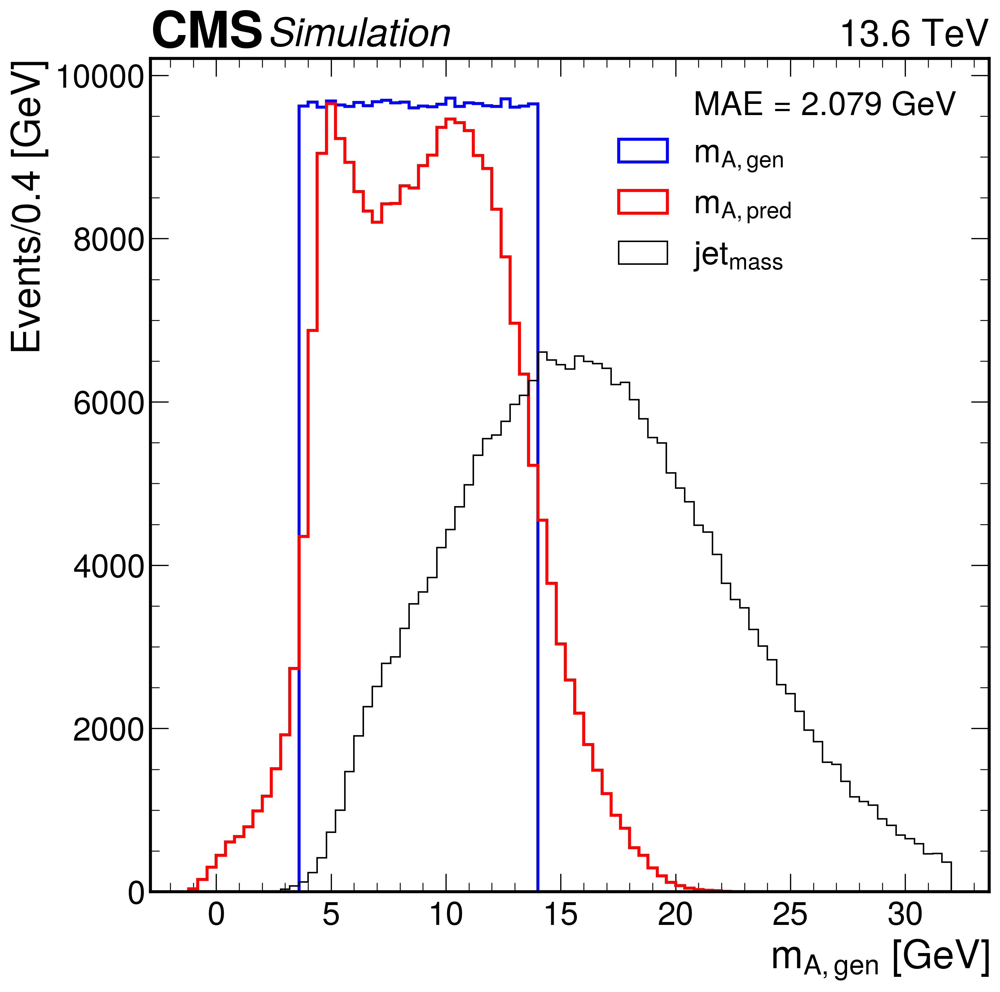

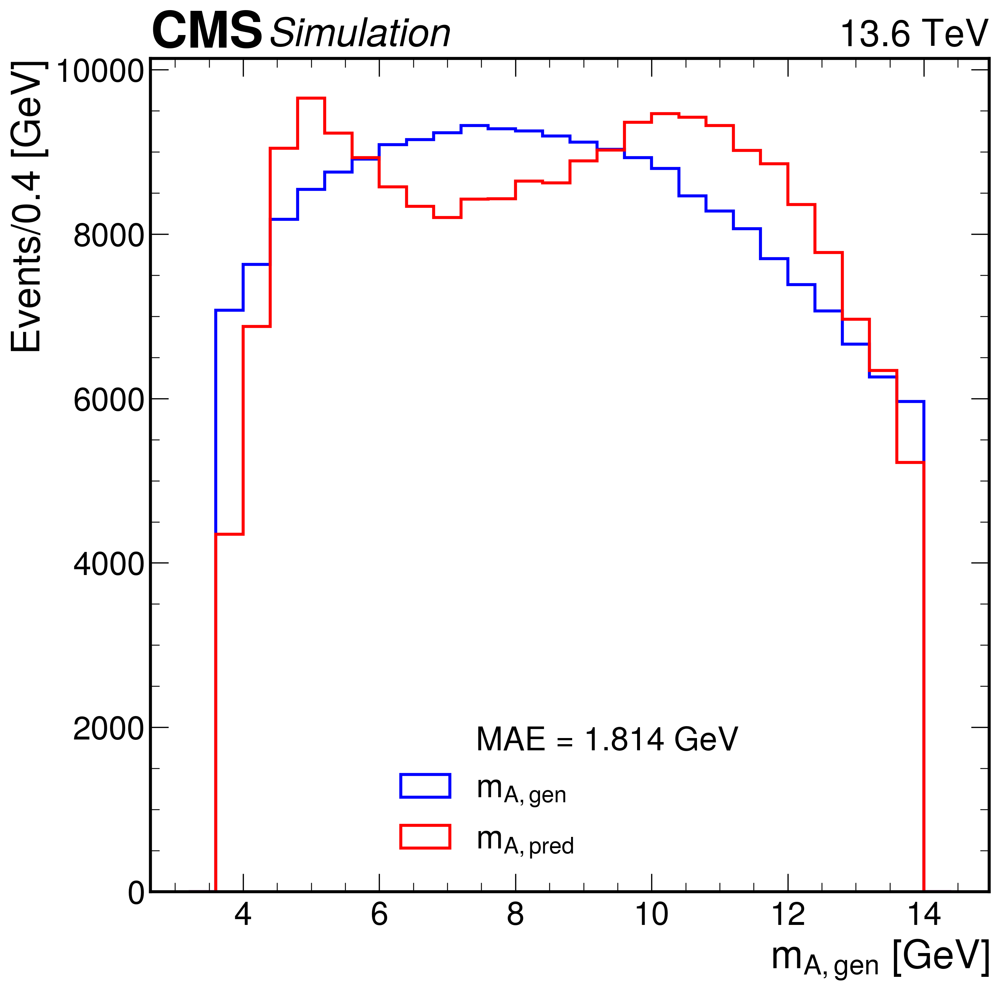

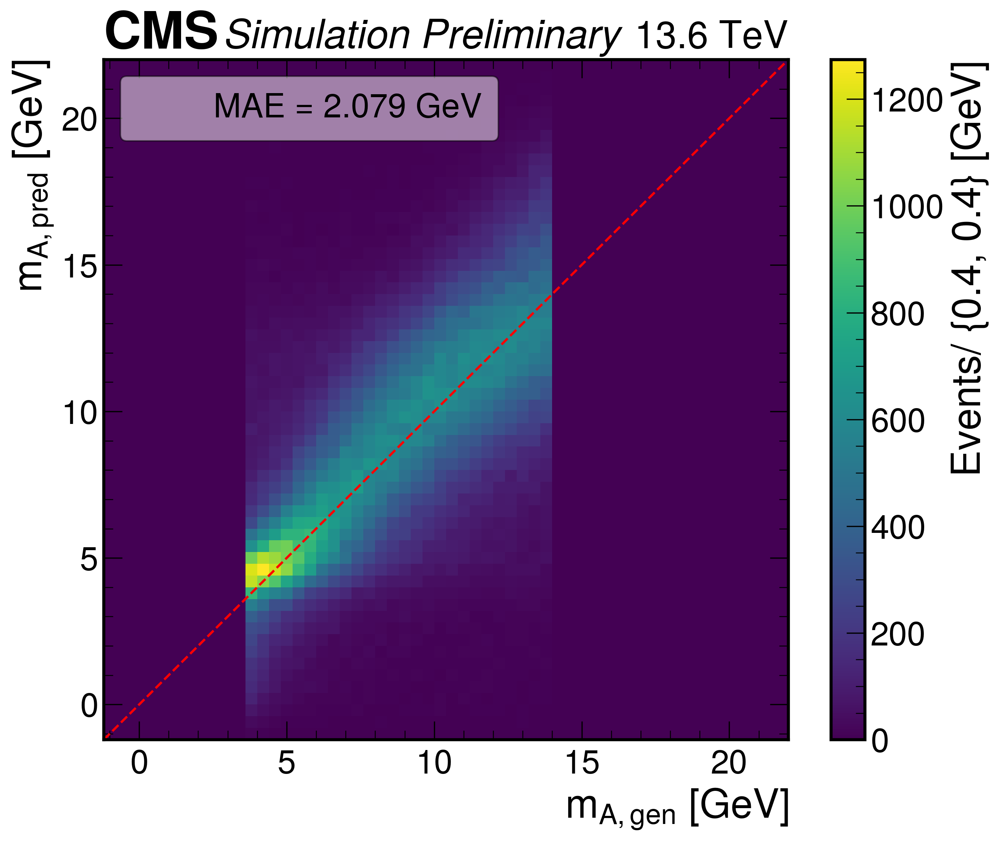

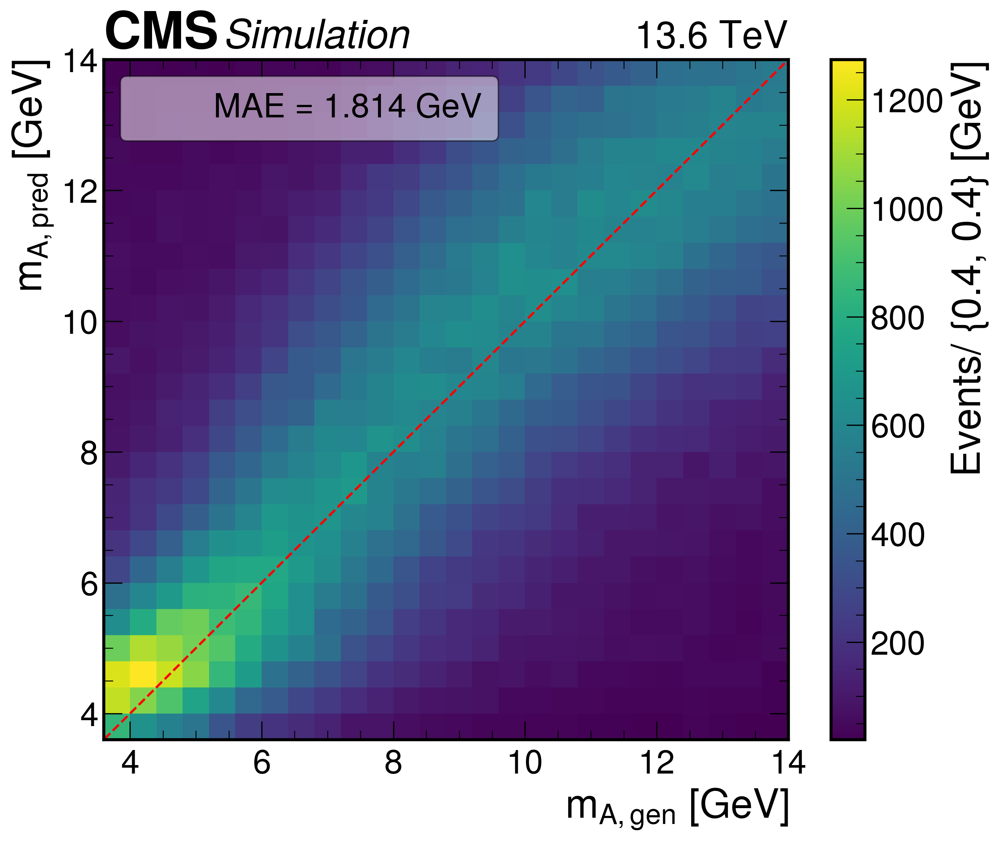

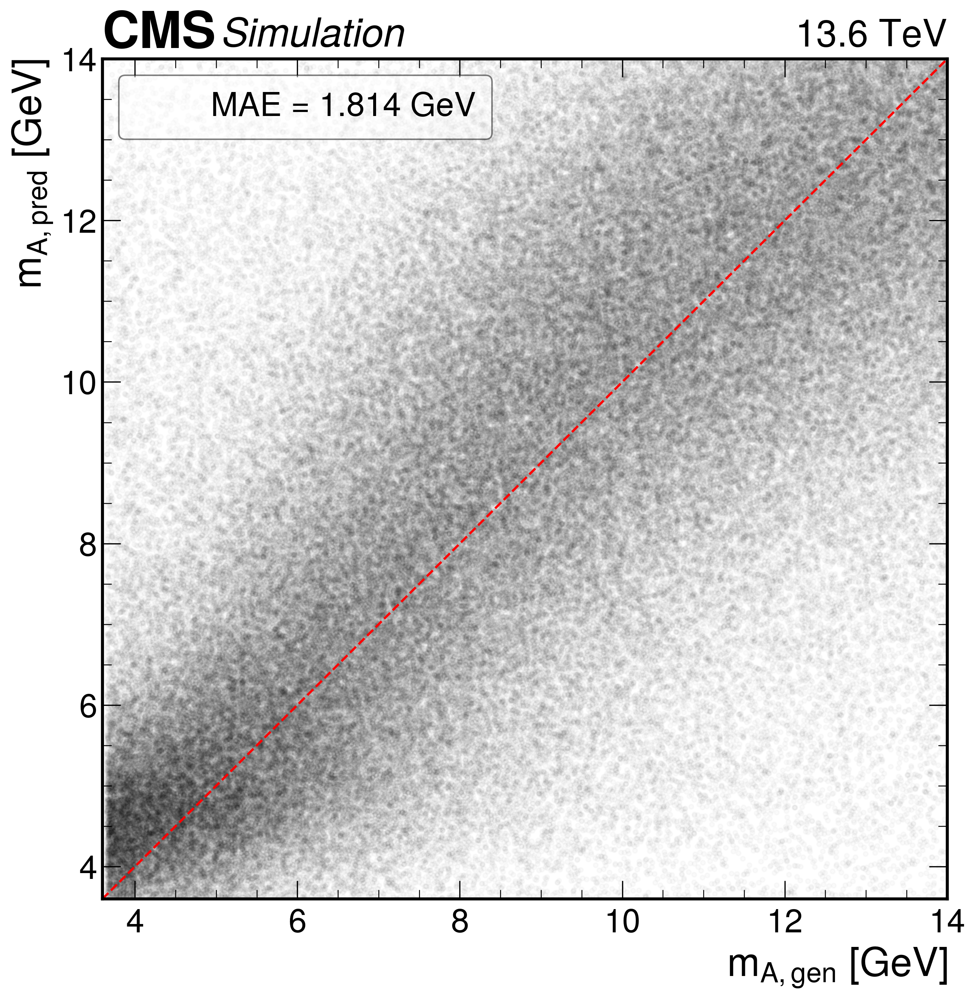

In [196]:
epoch=100
# for model_dir in model_dir_ua:
model_dir =  model_dir_ua[-1]
data_file = glob.glob(f"{data_dir}/{ua_dir}/{model_dir}/epoch_{epoch}_inference_data_m3p6To14.pkl")[0]
print(model_dir)
# print(f"loaded data file ------>  {data_file}")
infile = open(f"{data_file}", "rb")
data = pickle.load(infile)

# print(f"data.keys()------>  {data.keys()}")
infile.close()

m_true = data["m_true"]
m_pred = data["m_pred"]
m0 = data["m0"]

mask1 = (m_true >= 3.6) & (m_true <=14)
m_true_ = m_true[mask1]
m_pred_ = m_pred[mask1]
m0_ = m0[mask1]
mask2 = (m_pred_ >=3.6) & (m_pred_ <=14)
m_true__ = m_true_[mask2]
m_pred__ = m_pred_[mask2]
m0__ = m0_[mask2]


m0_min = -1.2
m0_max = 22.1
bin_size =0.4

fig, ax = plt.subplots(dpi=300)
plt.plot([], [], ' ', label='MAE = %.3f GeV'%np.mean(np.abs(m_true - m_pred)))
plt.hist(m_true,  bins=np.arange(m0_min,m0_max+10,bin_size), histtype='step', label=r'$m_{A, gen}$', linestyle='-', color='blue', linewidth=2)
plt.hist(m_pred, bins=np.arange(m0_min,m0_max+10,bin_size), histtype='step', label=r'$m_{A, pred}$', linestyle='-', color='red', linewidth=2)
plt.hist(m0, bins=np.arange(m0_min,m0_max+10,bin_size), histtype='step', label=r'$jet_{mass}$', linestyle='-', color='black')
plt.xlabel(r'$m_{A, gen}$ [GeV]')
plt.ylabel(r'Events/0.4 [GeV]')
plt.legend(loc='best')

hep.cms.label(llabel="Simulation", rlabel="13.6 TeV", loc=0, ax=ax)
plt.legend(loc='best', frameon=False, framealpha=0.5, facecolor='white', edgecolor='black')
# plt.savefig(f'{out_dir}/mtrue_mpred_mjet_{model_dir}_epoch_{epoch}_full_hist.pdf', bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

    
    
fig, ax = plt.subplots(dpi=300)
plt.plot([], [], ' ', label='MAE = %.3f GeV'%np.mean(np.abs(m_true__ - m_pred__)))
plt.hist(m_true__,  bins=np.arange(3.2, 14.5,bin_size), histtype='step', label=r'$m_{A, gen}$', linestyle='-', color='blue', linewidth=2)
plt.hist(m_pred__, bins=np.arange(3.2, 14.5,bin_size), histtype='step', label=r'$m_{A, pred}$', linestyle='-', color='red', linewidth=2)
plt.xlabel(r'$m_{A, gen}$ [GeV]')
plt.ylabel(r'Events/0.4 [GeV]')
plt.legend(loc='best')
hep.cms.label(llabel="Simulation", rlabel="13.6 TeV", loc=0, ax=ax)
# plt.savefig(f'{out_dir}/mtrue_mpred_{model_dir}_epoch_{epoch}_hist.pdf', bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()
    

fig, ax = plt.subplots(figsize=(10,8),dpi=300)
plt.plot([], [], ' ', label='MAE = %.3f GeV'%np.mean(np.abs(m_true - m_pred)))
hist = plt.hist2d(np.squeeze(m_true), np.squeeze(m_pred), bins=[np.arange(m0_min, m0_max, .4), np.arange(m0_min, m0_max, .4)])
plt.xlabel(r'$m_{A, gen}$ [GeV]')
plt.ylabel(r'$m_{A, pred}$ [GeV]')
plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--')
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13.6 TeV", loc=0, ax=ax)
plt.legend(loc='upper left', frameon=True, framealpha=0.5, facecolor='white', edgecolor='black')
# plt.savefig(f'{out_dir}/mtrue_mpred_{model_dir}_epoch_{epoch}_full_2d_hist.pdf', bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

fig, ax = plt.subplots(figsize=(10,8),dpi=300)
plt.plot([], [], ' ', label='MAE = %.3f GeV'%np.mean(np.abs(m_true__ - m_pred__)))
hist = plt.hist2d(np.squeeze(m_true__), np.squeeze(m_pred__), bins=[np.arange(3.6, 14.1, .4), np.arange(3.6, 14.1, .4)])
plt.xlabel(r'$m_{A, gen}$ [GeV]')
plt.ylabel(r'$m_{A, pred}$ [GeV]')
plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--')
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]')
hep.cms.label(llabel="Simulation", rlabel="13.6 TeV", loc=0, ax=ax)
plt.legend(loc='upper left', frameon=True, framealpha=0.5, facecolor='white', edgecolor='black')
# plt.savefig(f'{out_dir}/mtrue_mpred_roi_{model_dir}_epoch_{epoch}_2d_hist.pdf', bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()


fig, ax = plt.subplots(dpi=300)
plt.plot(m_true__, m_pred__, ".", color='black', alpha=0.02, label='MAE = %.3f GeV'%np.mean(np.abs(m_true__ - m_pred__)))
plt.xlabel(r'$m_{A, gen}$ [GeV]')
plt.ylabel(r'$m_{A, pred}$ [GeV]')
m0_min, m0_max = 3.6, 14.0
plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--')
hep.cms.label(llabel="Simulation", rlabel="13.6 TeV", loc=0, ax=ax)
plt.xlim(m0_min, m0_max)
plt.ylim(m0_min, m0_max)
plt.legend(loc='upper left', frameon=True, framealpha=0.5, facecolor='white', edgecolor='black')
# plt.savefig(f'{out_dir}/mtrue_mpred_roi_scatter_{model_dir}_epoch_{epoch}.pdf', bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()



### Plot predicted signal. jet mass 

In [41]:

def plot_pred_signal_mass_jet_mass(Mass, data_file, model_dir):
    infile = open(f"{data_file}", "rb")
    data = pickle.load(infile)
    print(model_dir)
    infile.close()

    m_true = {'3p7':3.7, '4':4, '6':6, '14':14}.get(Mass, None)
    m_pred = data["m_pred"]
    jet_mass = data["jet_mass"]
    jet_pt = data["jet_pt"]

    mask2 = (m_pred >=3.6) & (m_pred <=14)
    m_pred_ = m_pred[mask2]
    jet_mass_ = jet_mass[mask2]
    jet_pt_ = jet_pt[mask2]

    m0_min=-1.2
    m0_max=25.1
    bin_size =0.4
    fig, ax = plt.subplots(dpi=300)
    plt.axvline(m_true, label=r"$m_{true}$" + f"={m_true} GeV")
    plt.hist(m_pred, bins=np.arange(m0_min,m0_max,bin_size), histtype='step', label=r'$m_{pred}$  '+'(MAE = %.3f GeV)'%np.mean(np.abs(m_true - m_pred)), linestyle='-', color='red', linewidth=2)
    plt.hist(jet_mass, bins=np.arange(m0_min,m0_max,bin_size), histtype='step', label=r'$jet_{mass}$', linestyle='-', color='black')
    plt.xlabel(r'$m_{A, gen}$ [GeV]')
    plt.ylabel('Events/ 0.4 [GeV]')
    plt.legend(loc='upper right', fontsize=12)
    hep.cms.label(llabel="Simulation", rlabel=f"$m_A$={m_true} GeV          "    +   "13.6 TeV", loc=0, ax=ax)
    # plt.savefig(f'{out_dir}/signal_mass_{Mass}_inference_{model_dir}_epoch_{epoch}.pdf', bbox_inches='tight',dpi=300, facecolor = "w")
    plt.show()

ResNet_min_max_scaling_mN1p2To22


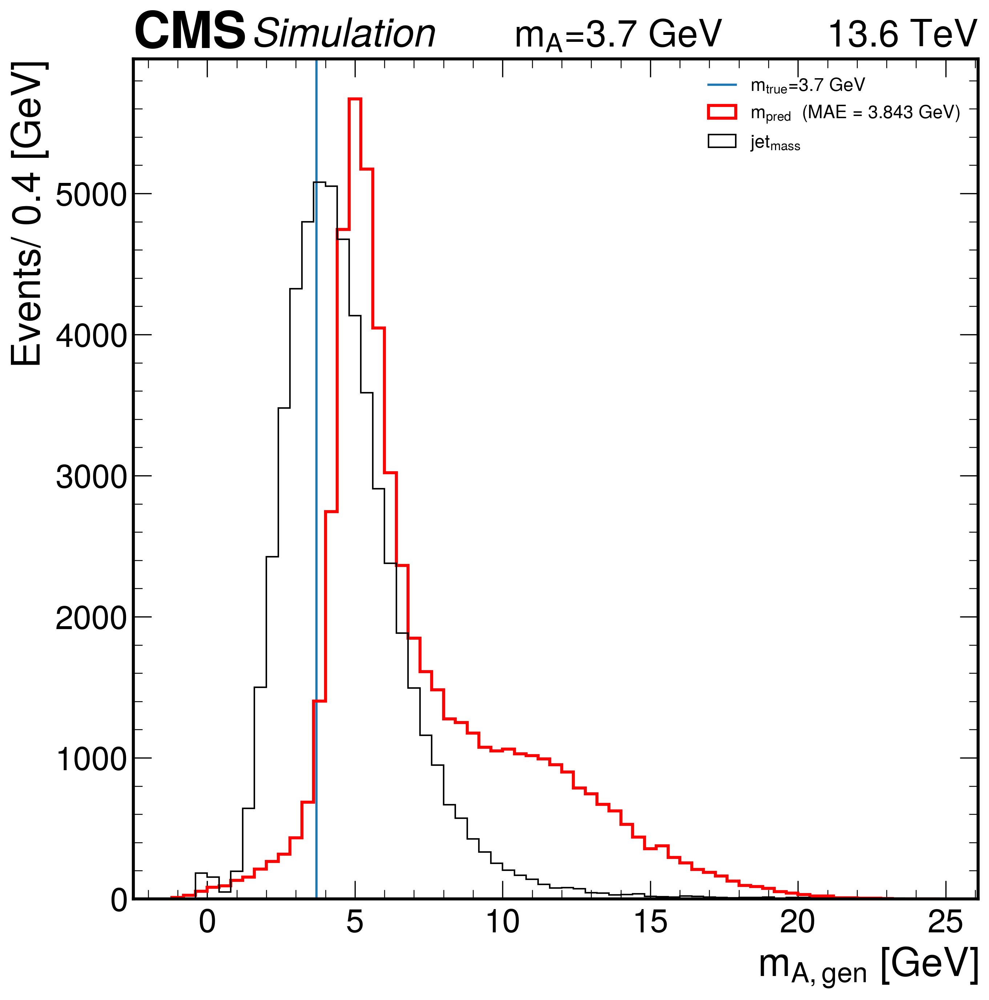

In [42]:
epoch=100
Mass = ['3p7', '14']
Mass=Mass[0]
for model_dir in model_dir_ua:
    data_file = glob.glob(f"{data_dir}/{ua_dir}/{model_dir}/signal_{Mass}_epoch_{epoch}_inference_data.pkl")[0]
    plot_pred_signal_mass_jet_mass(Mass, data_file, model_dir)

### Plot e2e prediction for different jet pt ranges

In [66]:

def plot_e2e_prediction_pf_jet_mass(mass=3.7, plot="m_pred", in_file="../analysis_run3/Data_for_plots/mass_regression_test_data/upper_lower_streching_epoch_36_signal_mass_3p7_inference_data.pkl", model="model"):
    infile = open(f"{in_file}", "rb")
    data = pickle.load(infile)
    print(f"loaded data file ------>  {data_file}")
    infile.close()
    m0_min, m0_max, bin_size = -1.2, 22.2, 0.4
    m_true = mass
    m_pred = data[f"{plot}"]
    jet_mass = data["jet_mass"]
    jet_pt = data["jet_pt"]

    mask1 = (jet_pt >=20) & (jet_pt <55)
    mask2 = (jet_pt >=55) & (jet_pt <70)
    mask3 = (jet_pt >=70) & (jet_pt <100)
    mask4 = jet_pt >=100

    m_pred1= m_pred[mask1]
    m_pred2= m_pred[mask2] 
    m_pred3= m_pred[mask3]
    m_pred4= m_pred[mask4]



    fig, ax = plt.subplots(dpi=300)
    if plot=='m_pred': 
        plt.plot([], [], ' ', label='From E2E')
        name_tag='E2E'
    else: 
         plt.plot([], [], ' ', label='From PF Jet mass')
         name_tag='Jet_mass'
    plt.axvline(m_true, linestyle='--', label=r"$m_{true}$" + f"={m_true} GeV", color='grey', alpha=0.5)

    # Define bin edges and centers
    bins = np.arange(m0_min, m0_max, bin_size)
    bin_centers = 0.5 * (bins[1:] + bins[:-1])




    # Helper to plot histogram and error bars
    def plot_with_errors(data, label, color, error_bar):
        counts, _ = np.histogram(data, bins=bins)
        norm = np.sum(counts)
        counts_norm = counts / norm
        errors = np.sqrt(counts) / norm
        # plt.hist(data, bins=bins, histtype='step', label=label, color=color, density=True, linewidth=2)
        plt.errorbar(bin_centers, counts_norm, yerr=errors, fmt=error_bar, color=color, markersize=6, linewidth=1, label=label)

    # Plot each pt region
    plot_with_errors(m_pred1, r'low $p_{T,jet}$ '+' (MAE = %.3f GeV)'%np.mean(np.abs(m_true - m_pred1)), 'red', 'o')
    plot_with_errors(m_pred2, r'mid $p_{T,jet}$ '+' (MAE = %.3f GeV)'%np.mean(np.abs(m_true - m_pred2)), 'black', 's')
    plot_with_errors(m_pred3, r'high $p_{T,jet}$ '+' (MAE = %.3f GeV)'%np.mean(np.abs(m_true - m_pred3)), 'blue', 'v')
    plot_with_errors(m_pred4, r'ultra $p_{T,jet}$ '+' (MAE = %.3f GeV)'%np.mean(np.abs(m_true - m_pred4)), 'green', 'd')
    plt.xlabel('$m_A$ [GeV]')
    plt.ylabel('Events density/ 0.4 [GeV]')
    plt.legend(loc='best', fontsize=14)
    hep.cms.label(llabel="Simulation  ", rlabel=f"$m_A$={m_true} GeV           "   +   "13.6 TeV", loc=0, ax=ax)
    plt.tight_layout()
    mass_str = str(mass).replace('.', 'p')
    # plt.savefig(f'{out_dir}/signal_mass_{mass_str}_prediction_from_{name_tag}_{model}.pdf',facecolor='w',dpi=300)
    plt.show()


ResNet_min_max_scaling_mN1p2To22
loaded data file ------>  ../analysis_run3/Data_for_plots/mass_regression_test_data/jupyter_notebook_new/ResNet_min_max_scaling_UA/ResNet_min_max_scaling_mN1p2To22/signal_3p7_epoch_100_inference_data.pkl


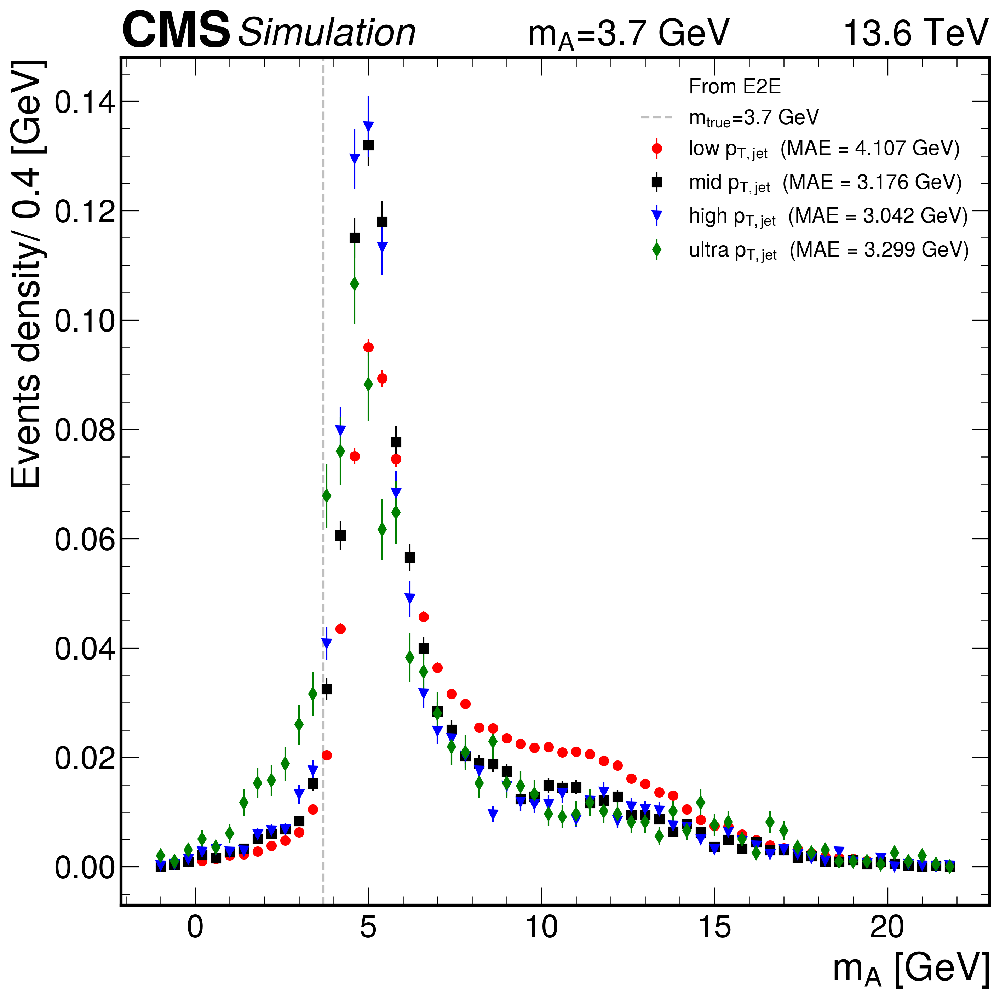

ResNet_min_max_scaling_mN1p2To22
loaded data file ------>  ../analysis_run3/Data_for_plots/mass_regression_test_data/jupyter_notebook_new/ResNet_min_max_scaling_UA/ResNet_min_max_scaling_mN1p2To22/signal_14_epoch_100_inference_data.pkl


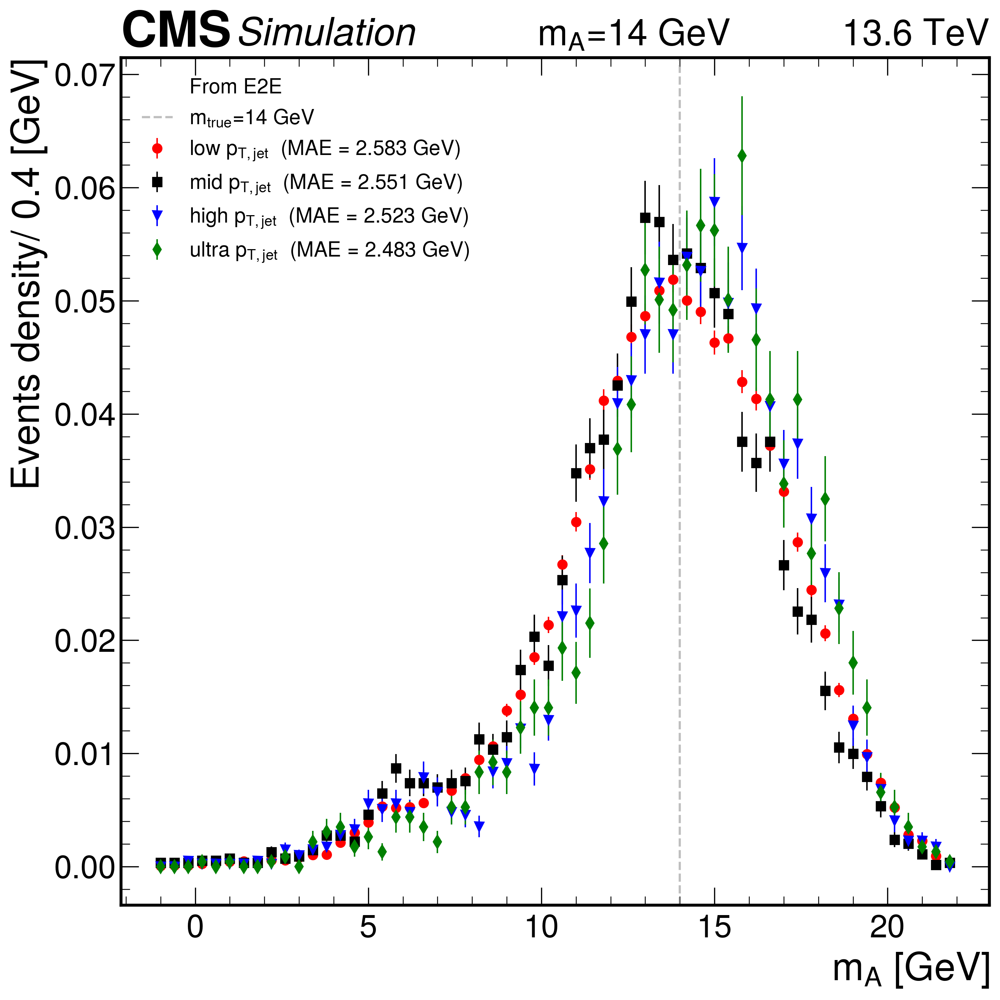

In [68]:
epoch=100
Masses = ['3p7', '14']
for Mass in Masses:
    m_true = {'3p7':3.7, '4':4, '6':6, '14':14}.get(Mass, None)
    model_dir = model_dir_ua[-1]
    data_file = glob.glob(f"{data_dir}/{ua_dir}/{model_dir}/signal_{Mass}_epoch_{epoch}_inference_data.pkl")[0]
    print(model_dir)
    plot_e2e_prediction_pf_jet_mass(mass=m_true, plot="m_pred", in_file=data_file, model=model_dir)
    
    

In [31]:
epoch=100

model_dir = model_dir_ua[0]
# file_in = glob.glob(f"{data_dir}/{ua_dir}/{model_dir}/epoch_{epoch}_inference_data_m3p6To14.pkl")[0]
file_in = glob.glob(f"{data_dir}/{ua_dir}/{model_dir}/13_ch_massregressor_ResNet/INFERENCE_DATA/epoch{epoch}_*_inference_data.pkl")[0]
print(model_dir)

ResNet_min_max_scaling_mN1p2To22


### Correction using mean of residuals

ResNet_min_max_scaling_mN1p2To22


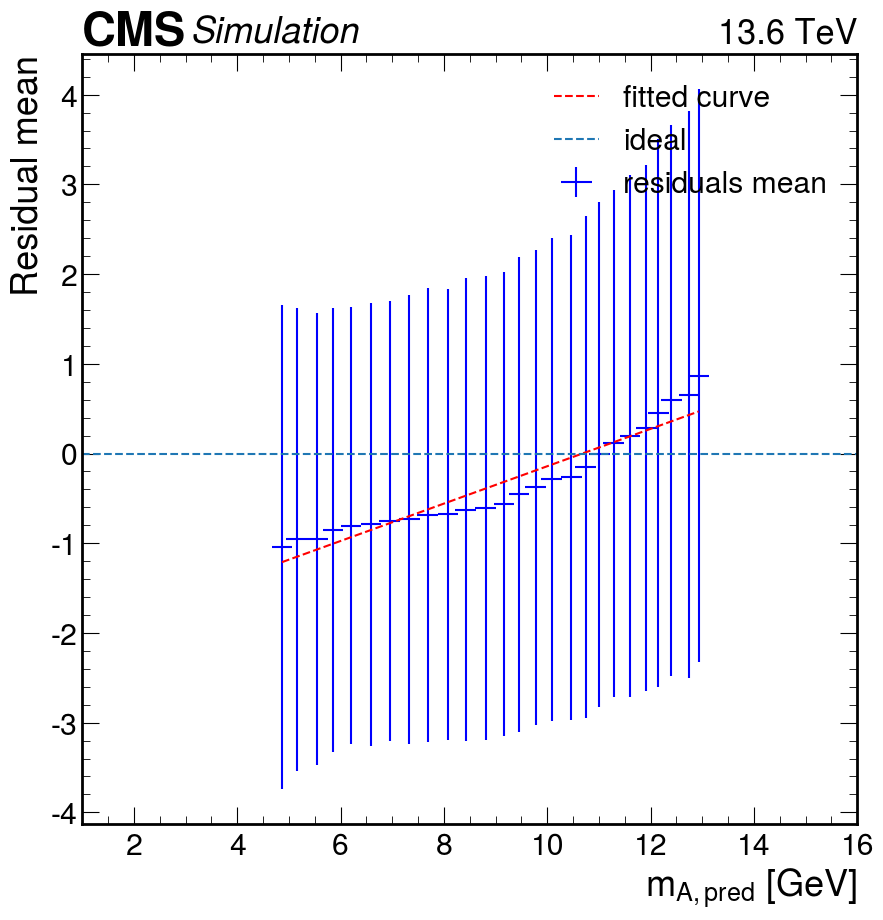

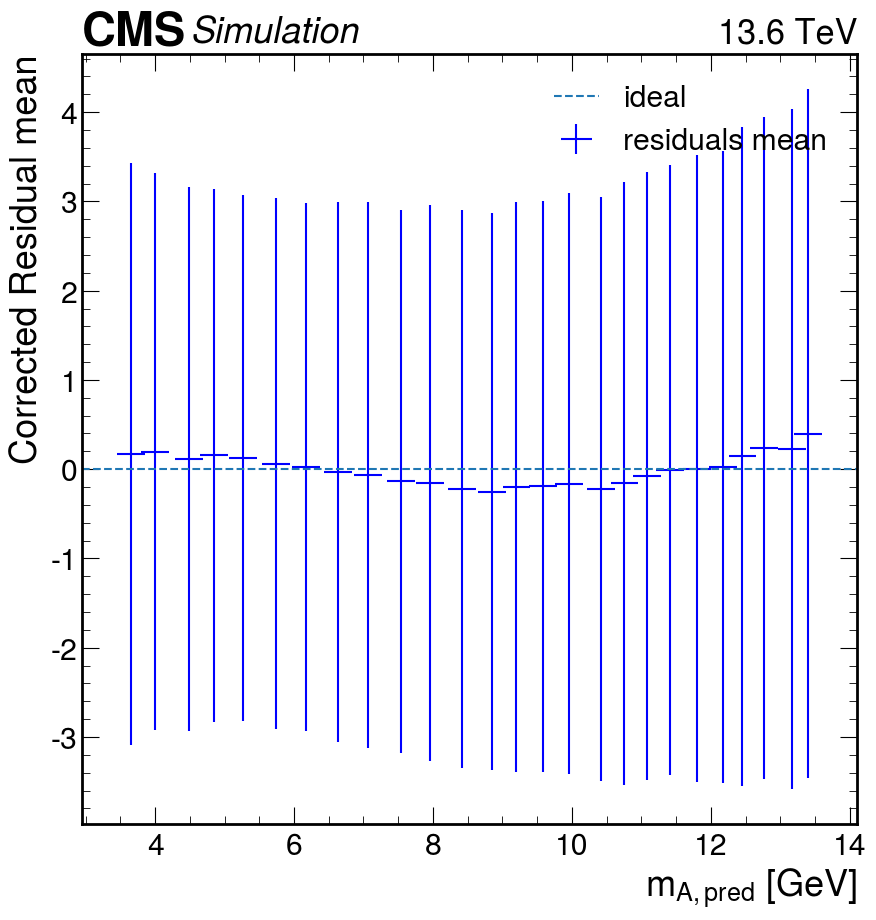

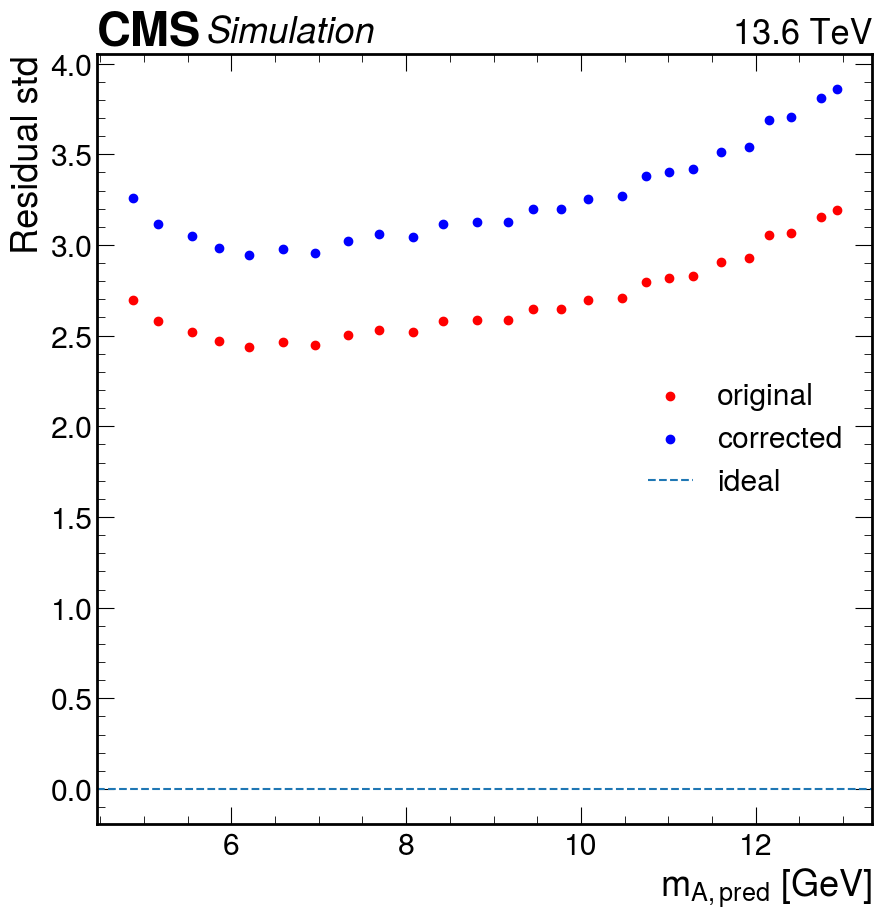

In [49]:
degree = 1
def corrected_pred_mean(m):
        mass = m + polynomial_mean(m)
        return mass
print(model_dir)
infile = open(f"{file_in}", "rb")
data = pickle.load(infile)
infile.close()

m_true=data["m_true"].flatten()
m_pred=data["m_pred"].flatten()
# mask = (m_true >= 3.6) & (m_true <= 14.0)
# m_pred = m_pred[mask]
# m_true = m_true[mask]
# mask2 = (m_pred >= 3.6) & (m_pred <= 14.0)
# m_pred = m_pred[mask2]
# m_true = m_true[mask2]


bins=np.arange(3.6,14.1,0.4)
mean_pred_bins = []
mean_true_bins =[]
residuals_mean = []
residuals_std = []
for i in range(len(bins)-1):
    temp_mass_pred = m_pred[(m_true >= bins[i]) & (m_true< bins[i+1])]
    temp_mean_mass_pred = np.mean(temp_mass_pred)
    mean_pred_bins.append(temp_mean_mass_pred)
    temp_mass_true = m_true[(m_true >= bins[i]) & (m_true< bins[i+1])]
    mean_true_bins.append(np.mean(temp_mass_true))
    temp_residual = temp_mass_true - temp_mass_pred
    mu, std = norm.fit(temp_residual)
    residuals_mean.append(mu)
    residuals_std.append(std)



coeff_mean = np.polyfit(mean_pred_bins, residuals_mean, degree)
polynomial_mean = np.poly1d(coeff_mean)
x = np.linspace(min(mean_pred_bins),max(mean_pred_bins), num=1000)
y_fit_mean = polynomial_mean(x)    

# print("---------------------- Original plot ---------------------------------")
fig, ax = plt.subplots()   
plt.errorbar(mean_pred_bins, residuals_mean, xerr=(bins[1] - bins[0]) / 2, yerr=residuals_std, fmt='none', color='b', label='residuals mean')
plt.plot(x,y_fit_mean, color='r',linestyle='--', label = f"fitted curve" )
plt.xlim(1,16)
plt.axhline(y=0, linestyle='--', label="ideal")
plt.xlabel(r'$m_{A, pred}$ [GeV]')
plt.ylabel("Residual mean")
plt.legend()
plt.legend(loc='best')
hep.cms.label(llabel="Simulation", rlabel="13.6 TeV", loc=0, ax=ax)
# plt.savefig(f'{out_dir}/residual_mean_from_original_prediction_from_{model_dir}.pdf',facecolor='w',dpi=300)
plt.show() 






# print("---------------------- frist correction plot ---------------------------------")


m_pred_c = corrected_pred_mean(m_pred).flatten()

mean_pred_bins_c = []
mean_true_bins_c =[]
residuals_mean_c = []
residuals_std_c = []
for i in range(len(bins)-1):
    temp_mass_pred_c = m_pred_c[(m_true >= bins[i]) & (m_true< bins[i+1])]
    temp_mean_mass_pred_c = np.mean(temp_mass_pred_c)
    mean_pred_bins_c.append(temp_mean_mass_pred_c)
    temp_mass_true_c = m_true[(m_true >= bins[i]) & (m_true< bins[i+1])]
    mean_true_bins_c.append(np.mean(temp_mass_true_c))
    temp_residual_c = temp_mass_true_c - temp_mass_pred_c
    mu_c, std_c = norm.fit(temp_residual_c)
    residuals_mean_c.append(mu_c)
    residuals_std_c.append(std_c)

coeff_mean1 = np.polyfit(mean_pred_bins_c, residuals_mean_c, 1)
polynomial_mean1 = np.poly1d(coeff_mean1)
y_fit_mean1 = polynomial_mean1(x)

fig, ax = plt.subplots() 
# plt.scatter(mean_pred_bins, residuals_mean,color='b',marker='o',label='residuals mean')
plt.errorbar(mean_pred_bins_c, residuals_mean_c, xerr=(bins[1] - bins[0]) / 2, yerr=residuals_std_c, fmt='none', color='b', label='residuals mean')
# plt.ylim(-4,4)
plt.axhline(y=0, linestyle='--', label="ideal")
plt.xlabel(r'$m_{A, pred}$ [GeV]')
plt.ylabel("Corrected Residual mean")
plt.legend()
plt.legend(loc='best')
hep.cms.label(llabel="Simulation", rlabel="13.6 TeV", loc=0, ax=ax)
# plt.savefig(f'{out_dir}/residual_mean_from_corrected_prediction_from_{model_dir}.pdf',facecolor='w',dpi=300)
plt.show() 


# coeff_std1 = np.polyfit(mean_pred_bins, residuals_std, 1)
# polynomial_std1 = np.poly1d(coeff_std1)
# y_fit_std1 = polynomial_std1(x)
fig, ax = plt.subplots()
plt.scatter(mean_pred_bins,residuals_std,color='r',marker='o',label='original')
plt.scatter(mean_pred_bins,residuals_std_c,color='b',marker='o',label='corrected')
plt.axhline(y=0, linestyle='--', label="ideal")
plt.xlabel(r'$m_{A, pred}$ [GeV]')
plt.ylabel("Residual std")
plt.legend()
plt.legend(loc='best')
hep.cms.label(llabel="Simulation", rlabel="13.6 TeV", loc=0, ax=ax)
# plt.savefig(f'{out_dir}/std_from_original_corredted_residuals_prediction_from_{model_dir}.pdf',facecolor='w',dpi=300)
plt.show() 




### Correction using mode of residuals

ResNet_min_max_scaling_mN1p2To22
Converged after 1100 bootstraps.
Converged after 1100 bootstraps.
Converged after 1100 bootstraps.
Converged after 1100 bootstraps.
Converged after 1100 bootstraps.
Converged after 2100 bootstraps.
Converged after 2100 bootstraps.
Converged after 2100 bootstraps.
Converged after 3100 bootstraps.
Converged after 1100 bootstraps.
Converged after 2100 bootstraps.
Converged after 3100 bootstraps.
Converged after 1100 bootstraps.
Converged after 2100 bootstraps.
Converged after 2100 bootstraps.
Converged after 1100 bootstraps.
Converged after 2100 bootstraps.
Converged after 1100 bootstraps.
Converged after 1100 bootstraps.
Converged after 2100 bootstraps.
Converged after 2100 bootstraps.
Converged after 2100 bootstraps.
Converged after 2100 bootstraps.
Converged after 1100 bootstraps.
Converged after 1100 bootstraps.
Converged after 1100 bootstraps.


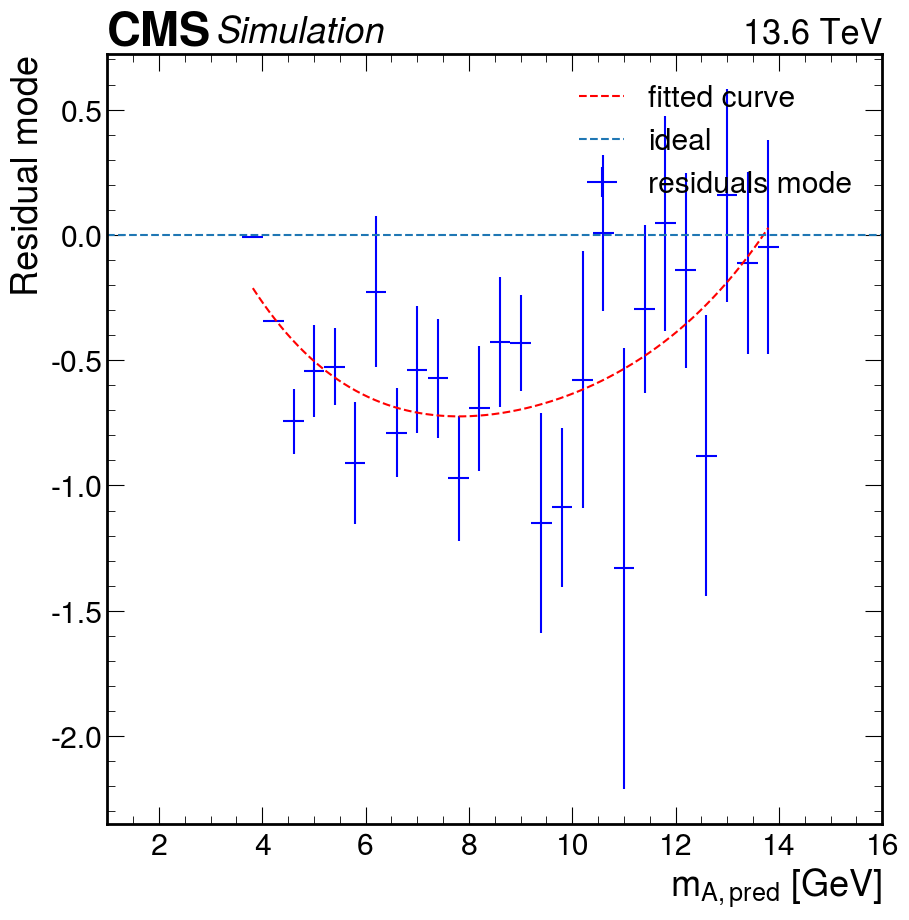

Converged after 1100 bootstraps.
Converged after 2100 bootstraps.
Converged after 1100 bootstraps.
Converged after 1100 bootstraps.
Converged after 1100 bootstraps.
Converged after 1100 bootstraps.
Converged after 1100 bootstraps.
Converged after 1100 bootstraps.
Converged after 1100 bootstraps.
Converged after 2100 bootstraps.
Converged after 2100 bootstraps.
Converged after 2100 bootstraps.
Converged after 3100 bootstraps.
Converged after 2100 bootstraps.
Converged after 2100 bootstraps.
Converged after 1100 bootstraps.
Converged after 2100 bootstraps.
Converged after 4100 bootstraps.
Converged after 5100 bootstraps.
Converged after 2100 bootstraps.
Converged after 1100 bootstraps.
Converged after 2100 bootstraps.
Converged after 4100 bootstraps.
Converged after 1100 bootstraps.
Converged after 1100 bootstraps.
Converged after 2100 bootstraps.


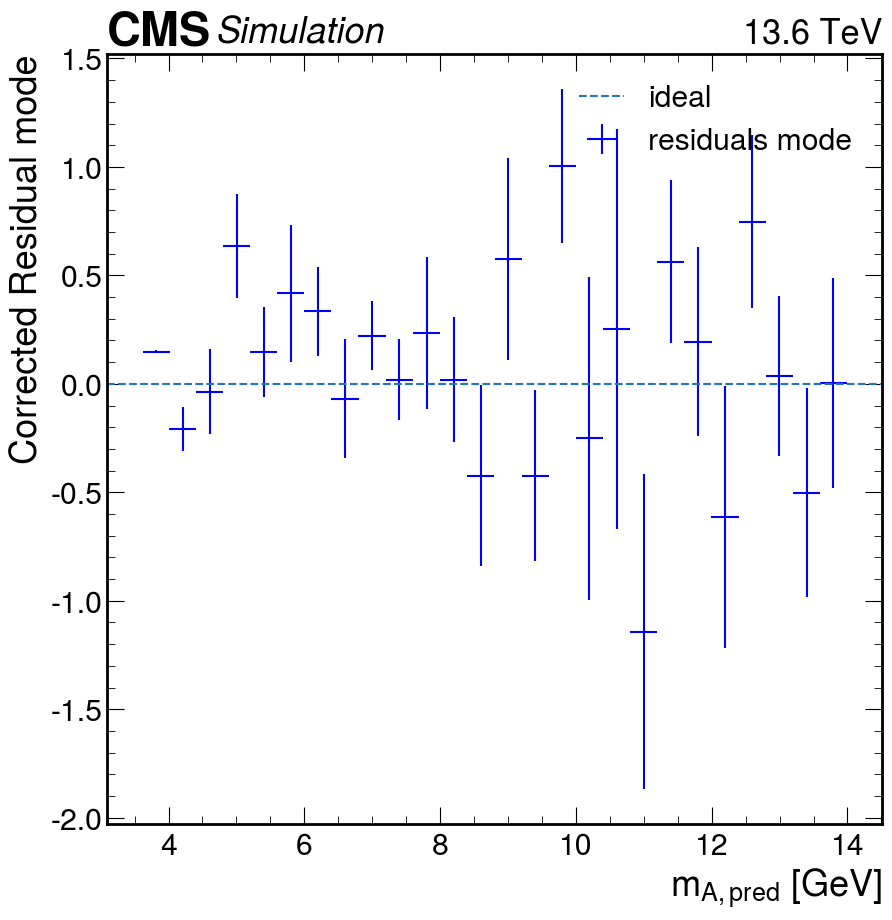

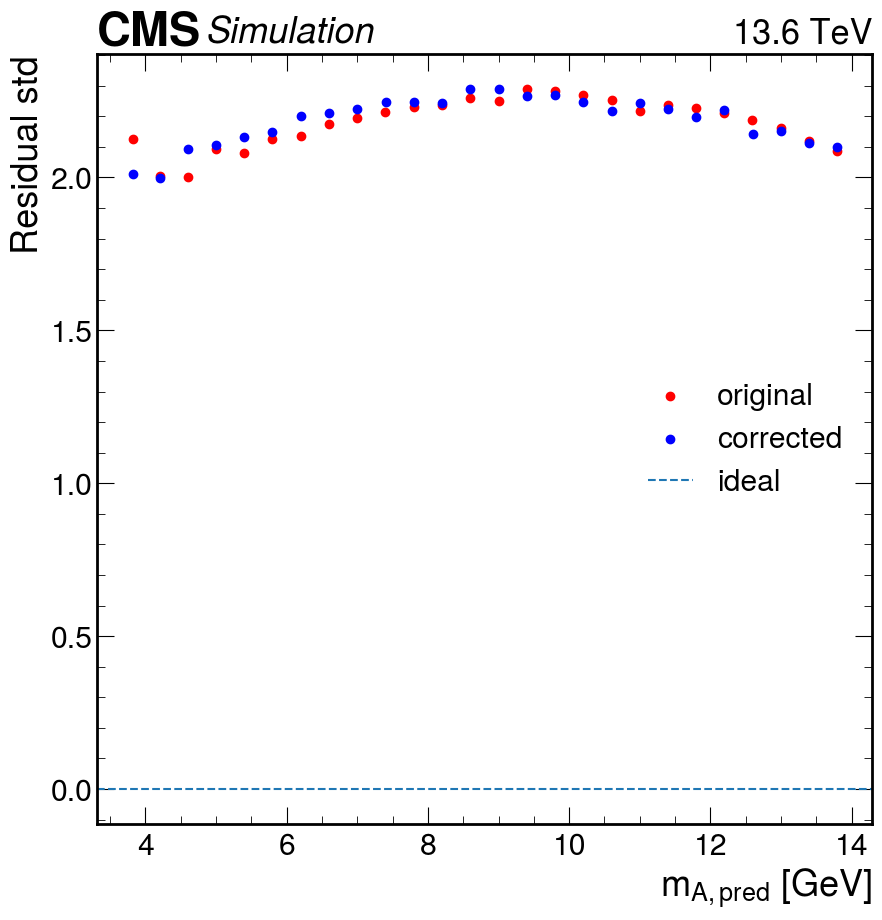

In [33]:
print(model_dir)

def get_hist_mode(data, bins=len(np.arange(3.6,14.01,0.05))):
    counts, bin_edges = np.histogram(data, bins=bins)

    # Find the index of the mode bin
    mode_bin_index = np.argmax(counts)

    # Get the mode bin range
    mode_bin_start = bin_edges[mode_bin_index]
    mode_bin_end = bin_edges[mode_bin_index + 1]
    
    return (mode_bin_end + mode_bin_start)/2

def compute_uncertainty(data, n_bootstraps=10):
    mode_bins = []

    for _ in range(n_bootstraps):
        bootstrap_sample = np.random.choice(data, size=len(data), replace=True)
        counts, bin_edges = np.histogram(bootstrap_sample, bins=30)
        mode_bin_index = np.argmax(counts)
        mode_bin_start = bin_edges[mode_bin_index]
        mode_bin_end = bin_edges[mode_bin_index + 1]
        mode_bins.append((mode_bin_start + mode_bin_end) / 2)

    return np.std(mode_bins)

def find_convergence(data, initial_bootstraps=100, max_bootstraps=10000, step=1000, threshold=0.01):
    n_bootstraps = initial_bootstraps
    prev_uncertainty = compute_uncertainty(data, n_bootstraps)
    uncertainties = [(n_bootstraps, prev_uncertainty)]
    
    while n_bootstraps <= max_bootstraps:
        n_bootstraps += step
        current_uncertainty = compute_uncertainty(data, n_bootstraps)
        uncertainties.append((n_bootstraps, current_uncertainty))
        
        # Check for convergence
        if abs(current_uncertainty - prev_uncertainty) < threshold:
            print(f"Converged after {n_bootstraps} bootstraps.")
            break
            
        prev_uncertainty = current_uncertainty
    
    return prev_uncertainty, n_bootstraps






infile = open(f"{file_in}", "rb")
data = pickle.load(infile)
infile.close()

m0_min = 1.2
m0_max = 18.2


m_true_=data["m_true"]
m_pred_=data["m_pred"]
m_true = np.concatenate(m_true_).flatten()
m_pred = np.concatenate(m_pred_).flatten()
mask = (m_true >= 3.6) & (m_true <= 14.0)
m_pred = m_pred[mask]
m_true = m_true[mask]
mask2 = (m_pred >= 3.6) & (m_pred <= 14.0)
m_pred = m_pred[mask2]
m_true = m_true[mask2]


# Initial calculations
bins = np.arange(3.6, 14.1, 0.4)
mean_pred_bins = []
mean_true_bins = []
residuals_mean = []
residuals_std = []
residuals_mode = []
mode_errors = []
for i in range(len(bins) - 1):
    temp_mass_pred = m_pred[(m_pred >= bins[i]) & (m_pred < bins[i + 1])]
    temp_mean_mass_pred = np.mean(temp_mass_pred)
    mean_pred_bins.append(temp_mean_mass_pred)
    temp_mass_true = m_true[(m_pred >= bins[i]) & (m_pred < bins[i + 1])]
    mean_true_bins.append(np.mean(temp_mass_true))
    temp_residual = temp_mass_true - temp_mass_pred
    mu, std = temp_residual.mean(), temp_residual.std()
    residuals_mean.append(mu)
    residuals_std.append(std)
    residuals_mode.append(get_hist_mode(temp_residual))
    uncertainty, n_bootstraps = find_convergence(temp_residual)
    mode_errors.append(uncertainty)

# Polynomial fit
coeff_mode = np.polyfit(mean_pred_bins, residuals_mode, 4)
polynomial_mode = np.poly1d(coeff_mode)
x = np.linspace(min(mean_pred_bins), max(mean_pred_bins), num=1000)
y_fit_mean = polynomial_mode(x)

# First plot with error bars
fig, ax = plt.subplots()
plt.errorbar(mean_pred_bins, residuals_mode, xerr=(bins[1] - bins[0]) / 2, yerr=mode_errors, fmt='none', color='b', label='residuals mode')
plt.plot(x, y_fit_mean, color='r', linestyle='--', label=f"fitted curve")
hep.cms.label(llabel="Simulation", rlabel="13.6 TeV", loc=0, ax=ax)
plt.xlim(1, 16)
plt.axhline(y=0, linestyle='--', label="ideal")
plt.xlabel(r'$m_{A, pred}$ [GeV]')
plt.ylabel("Residual mode")
plt.legend()
# plt.savefig(f'{out_dir}/residual_mode_from_original_prediction_from_{model_dir}.pdf',facecolor='w',dpi=300)
plt.show()

# Correction function
def corrected_pred_mode(m):
    mass = m + polynomial_mode(m)
    return mass

m_pred = corrected_pred_mode(m_pred)

# Recalculate for corrected predictions
mean_pred_bins_2 = []
mean_true_bins_2 = []
residuals_mean_2 = []
residuals_std_2 = []
residuals_mode_2 = []
mode_errors_2 = []
for i in range(len(bins) - 1):
    temp_mass_pred = m_pred[(m_pred >= bins[i]) & (m_pred < bins[i + 1])]
    temp_mean_mass_pred = np.mean(temp_mass_pred)
    mean_pred_bins_2.append(temp_mean_mass_pred)
    temp_mass_true = m_true[(m_pred >= bins[i]) & (m_pred < bins[i + 1])]
    mean_true_bins_2.append(np.mean(temp_mass_true))
    temp_residual = temp_mass_true - temp_mass_pred
    mu, std = norm.fit(temp_residual)
    residuals_mean_2.append(mu)
    residuals_std_2.append(std)
    residuals_mode_2.append(get_hist_mode(temp_residual))
    uncertainty, n_bootstraps = find_convergence(temp_residual)
    mode_errors_2.append(uncertainty)

# Second plot with error bars
fig, ax = plt.subplots()
plt.errorbar(mean_pred_bins, residuals_mode_2, xerr=(bins[1] - bins[0]) / 2, yerr=mode_errors_2, fmt='none', color='b', label='residuals mode')
plt.axhline(y=0, linestyle='--', label="ideal")
hep.cms.label(llabel="Simulation", rlabel="13.6 TeV", loc=0, ax=ax)
plt.xlabel(r'$m_{A, pred}$ [GeV]')
plt.ylabel("Corrected Residual mode")
plt.legend()
# plt.savefig(f'{out_dir}/residual_mode_from_corrected__prediction_from_{model_dir}.pdf',facecolor='w',dpi=300)
plt.show()


fig, ax = plt.subplots()
plt.scatter(mean_pred_bins,residuals_std,color='r',marker='o',label='original')
plt.scatter(mean_pred_bins_2,residuals_std_2,color='b',marker='o',label='corrected')
plt.axhline(y=0, linestyle='--', label="ideal")
plt.xlabel(r'$m_{A, pred}$ [GeV]')
plt.ylabel("Residual std")
plt.legend()
plt.legend(loc='best')
hep.cms.label(llabel="Simulation", rlabel="13.6 TeV", loc=0, ax=ax)
plt.show() 

### Std from correction resudual mean and mode

mean_pred_bins 4.8679404 12.931503


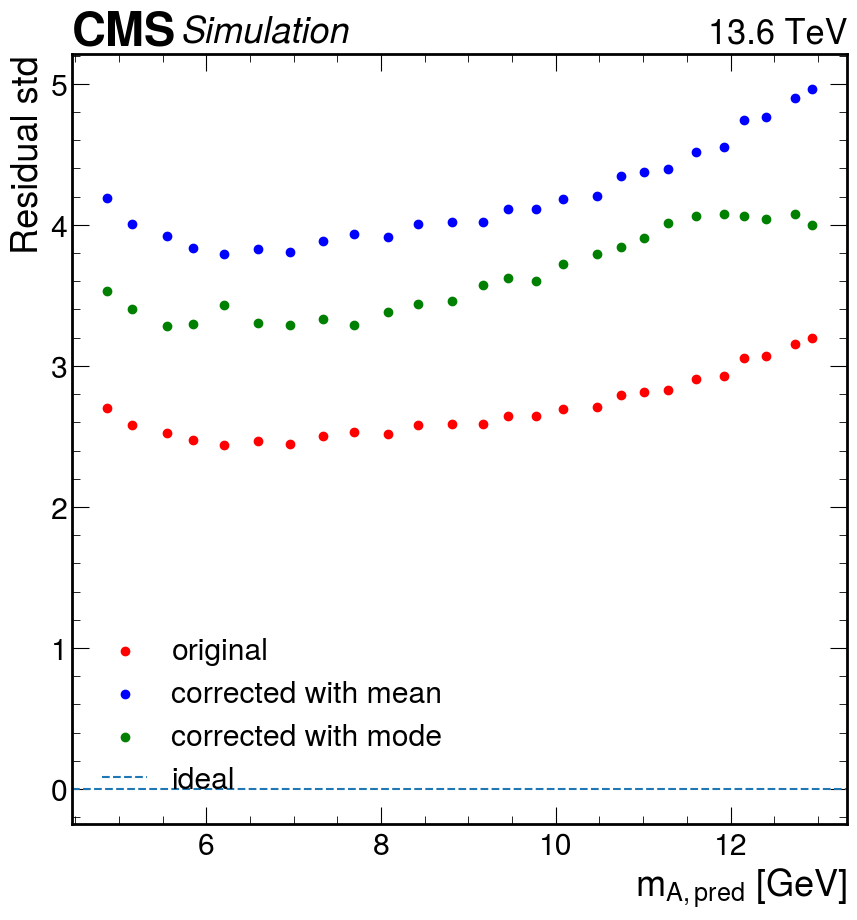

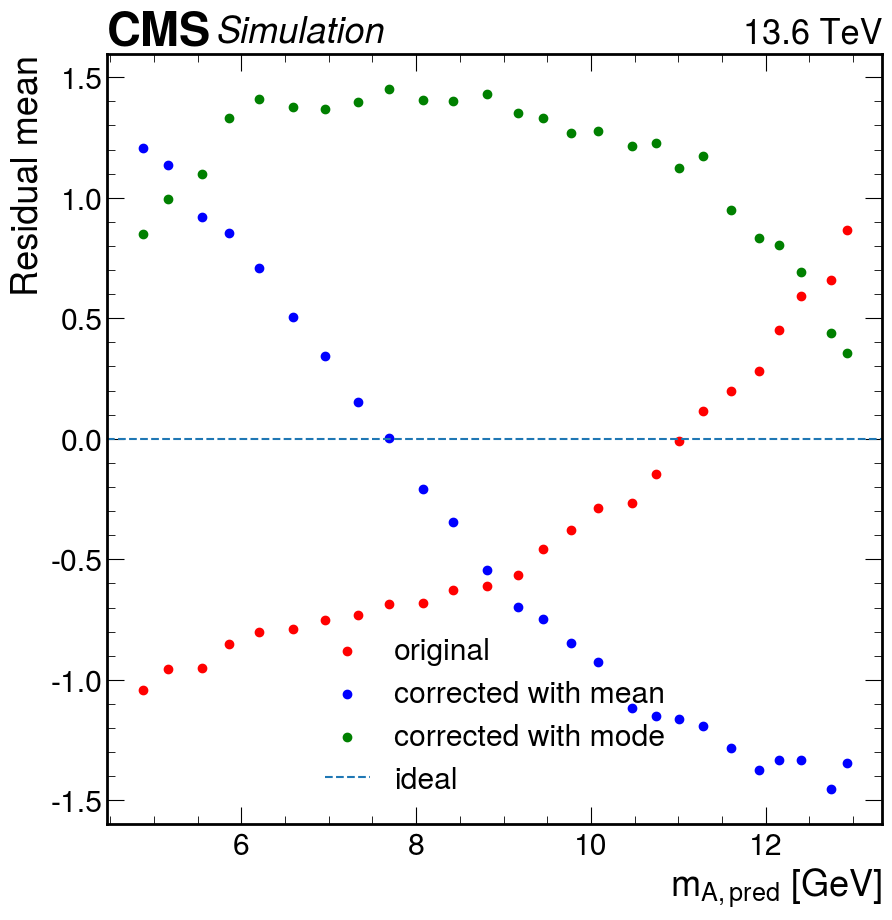

In [34]:
infile = open(f"{file_in}", "rb")
data = pickle.load(infile)
infile.close()

m_true=data["m_true"].flatten()
m_pred=data["m_pred"].flatten()
# mask = (m_true >= 3.6) & (m_true <= 14.0)
# m_pred = m_pred[mask]
# m_true = m_true[mask]
# mask2 = (m_pred >= 3.6) & (m_pred <= 14.0)
# m_pred = m_pred[mask2]
# m_true = m_true[mask2]


bins = np.arange(3.6, 14.1, 0.4)
mean_pred_bins = []
mean_true_bins =[]
residuals_mean = []
residuals_std = []
for i in range(len(bins)-1):
    temp_mass_pred = m_pred[(m_true >= bins[i]) & (m_true< bins[i+1])]
    # print("bins---", bins[i], bins[i+1])
    # print("temp_mass_pred ", temp_mass_pred )
    temp_mean_mass_pred = np.mean(temp_mass_pred)
    mean_pred_bins.append(temp_mean_mass_pred)
    # print("temp_mean_mass_pred", temp_mean_mass_pred)
    temp_mass_true = m_true[(m_true >= bins[i]) & (m_true< bins[i+1])]
    mean_true_bins.append(np.mean(temp_mass_true))
    temp_residual = temp_mass_true - temp_mass_pred
    mu, std = norm.fit(temp_residual)
    residuals_mean.append(mu)
    residuals_std.append(std)
print("mean_pred_bins", np.min(mean_pred_bins), np.max(mean_pred_bins))



m_pred_mean = corrected_pred_mean(m_pred).flatten()

mean_pred_bins_c = []
mean_true_bins_c =[]
residuals_mean_c = []
residuals_std_c = []
for i in range(len(bins)-1):
    temp_mass_pred = m_pred_mean[(m_true >= bins[i]) & (m_true< bins[i+1])]
    temp_mean_mass_pred = np.mean(temp_mass_pred)
    mean_pred_bins_c.append(temp_mean_mass_pred)
    temp_mass_true = m_true[(m_true >= bins[i]) & (m_true< bins[i+1])]
    mean_true_bins_c.append(np.mean(temp_mass_true))
    temp_residual = temp_mass_true - temp_mass_pred
    mu, std = norm.fit(temp_residual)
    residuals_mean_c.append(mu)
    residuals_std_c.append(std)
    
    
m_pred_mode = corrected_pred_mode(m_pred)


mean_pred_bins_2 = []
mean_true_bins_2 = []
residuals_mean_2 = []
residuals_std_2 = []
residuals_mode_2 = []
mode_errors_2 = []

for i in range(len(bins) - 1):
    temp_mass_pred = m_pred_mode[(m_pred >= bins[i]) & (m_pred < bins[i + 1])]
    temp_mean_mass_pred = np.mean(temp_mass_pred)
    mean_pred_bins_2.append(temp_mean_mass_pred)
    temp_mass_true = m_true[(m_pred >= bins[i]) & (m_pred < bins[i + 1])]
    mean_true_bins_2.append(np.mean(temp_mass_true))
    temp_residual = temp_mass_true - temp_mass_pred
    mu, std = norm.fit(temp_residual)
    residuals_mean_2.append(mu)
    residuals_std_2.append(std)
    residuals_mode_2.append(get_hist_mode(temp_residual))
# print("m_pred", np.min(m_pred), np.max(m_pred))  
# print("mean_pred_bins", np.min(mean_pred_bins), np.max(mean_pred_bins))
fig, ax = plt.subplots()
plt.scatter(mean_pred_bins,residuals_std,color='r',marker='o',label='original')
plt.scatter(mean_pred_bins,residuals_std_c,color='b',marker='o',label='corrected with mean')
plt.scatter(mean_pred_bins,residuals_std_2,color='g',marker='o',label='corrected with mode')
plt.axhline(y=0, linestyle='--', label="ideal")
plt.xlabel(r'$m_{A, pred}$ [GeV]')
plt.ylabel("Residual std")
plt.legend()
plt.legend(loc='best')
hep.cms.label(llabel="Simulation", rlabel="13.6 TeV", loc=0, ax=ax)
# plt.savefig(f'{out_dir}/residual_std__for_mean_mode_correction_{model_dir}.pdf',facecolor='w',dpi=300)
plt.show() 

fig, ax = plt.subplots()
plt.scatter(mean_pred_bins,residuals_mean,color='r',marker='o',label='original')
plt.scatter(mean_pred_bins,residuals_mean_c,color='b',marker='o',label='corrected with mean')
plt.scatter(mean_pred_bins,residuals_mean_2,color='g',marker='o',label='corrected with mode')
plt.axhline(y=0, linestyle='--', label="ideal")
plt.xlabel(r'$m_{A, pred}$ [GeV]')
plt.ylabel("Residual mean")
plt.legend()
plt.legend(loc='best')
hep.cms.label(llabel="Simulation", rlabel="13.6 TeV", loc=0, ax=ax)
plt.show() 


### Corrected prediction comparison between mean and mode

In [62]:
def plot_signal_corrected_with_mean_mode(Mass ='3p7', in_file='in_file'):
    mass  = {'3p7':3.7,'4':4, '5':5, '6':6, '8':8, '10':10, '12':12, '14':14}.get(Mass, None)
    print("Signal Mass : ", mass)


    
    bin_size = 0.4




    infile = open(f"{in_file}", "rb")
    data = pickle.load(infile)
    # print("keys-----", data.keys())
    infile.close()
    m_true_ = data["m_true"]
    m_pred_ = data["m_pred"]
    m_pred_mean = corrected_pred_mean(m_pred_)
    m_pred_mode = corrected_pred_mode(m_pred_)


    fig, ax = plt.subplots(dpi=300)
    plt.hist(np.array(m_pred_mean).flatten(), range=(mass-10,mass+10), bins=len(np.arange(0,m0_max+1.2,bin_size)), histtype='step',  linestyle='-', color='b', linewidth=2, label='corr. with mean '+' (MAE = %.3f GeV)'%np.mean(np.abs(mass - m_pred_mean)))
    plt.hist(np.array(m_pred_mode).flatten(), range=(mass-10,mass+10), bins=len(np.arange(0,m0_max+1.2,bin_size)), histtype='step',  linestyle='-', color='red', linewidth=2, label='corr. with mode '+' (MAE = %.3f GeV)'%np.mean(np.abs(mass - m_pred_mode)))
    plt.hist(np.array(m_pred_).flatten(), range=(mass-10,mass+10), bins=len(np.arange(0,m0_max+1.2,bin_size)),  linestyle='--', color='grey', alpha=0.2, label='original E2E '+' (MAE = %.3f GeV)'%np.mean(np.abs(mass - m_pred_)))
    plt.axvline(x= mass,linestyle='--',label=f'True {Mass}')
    plt.xlabel('Mass [GeV]')
    plt.ylabel('Events density/ 0.4 [GeV]')
    plt.legend(loc='best', fontsize=14)
    hep.cms.label(llabel="Simulation", rlabel=f"$m_A$={mass} GeV    "  + "    13.6 TeV", loc=0, ax=ax)
    plt.show() 

Signal Mass :  3.7


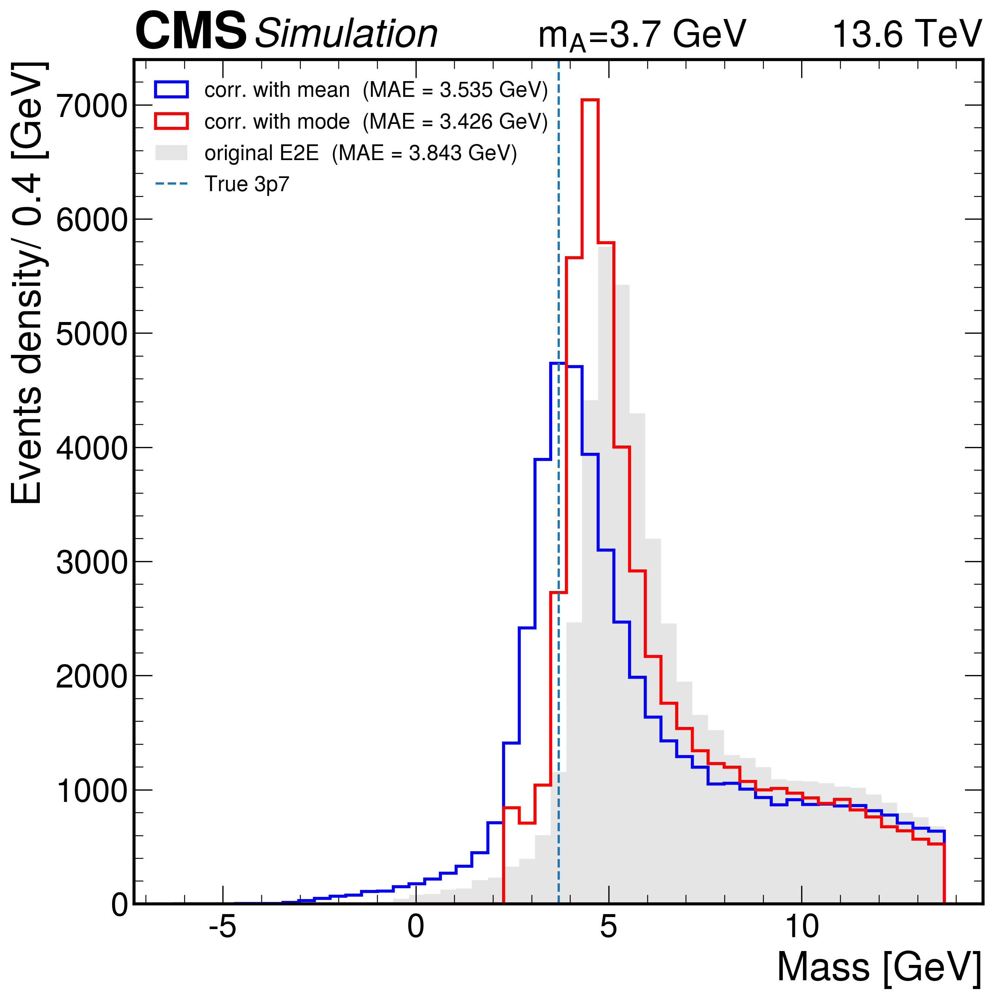

Signal Mass :  14


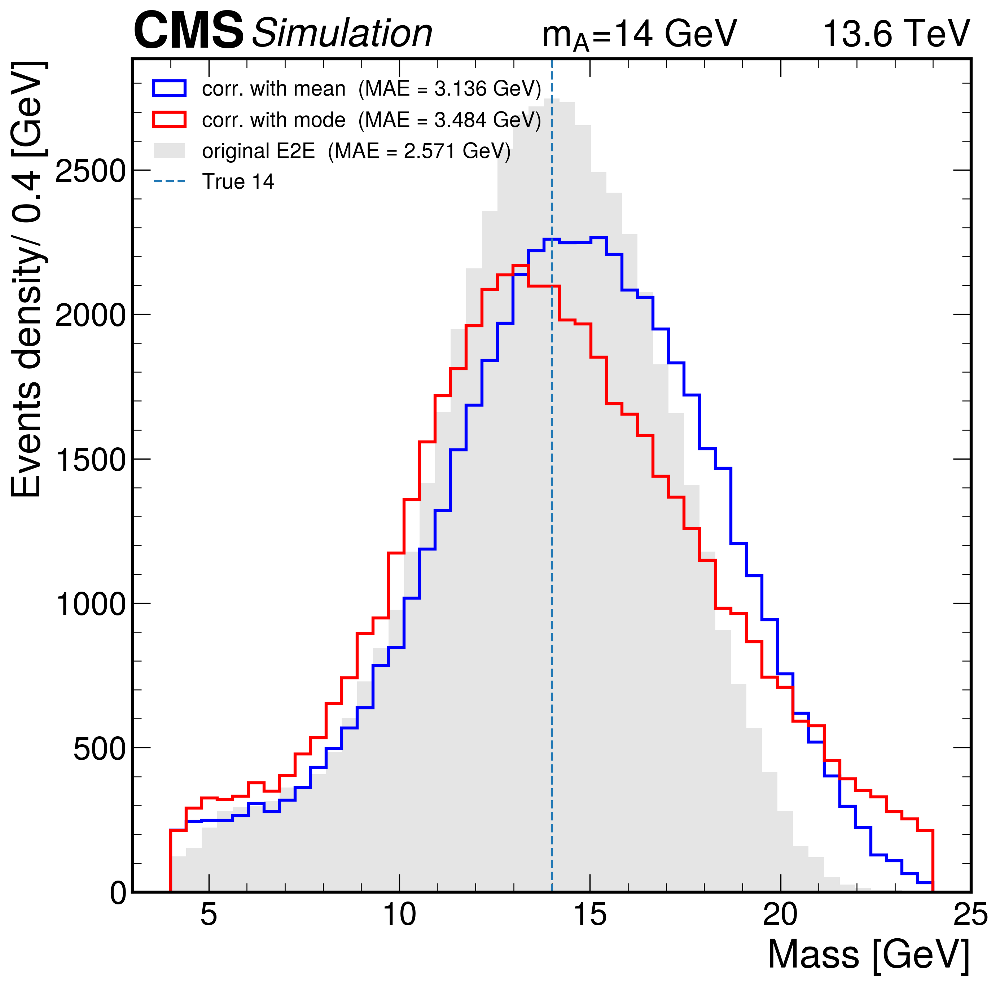

In [63]:
epoch=100
Masses = ['3p7', '14']
for Mass in Masses:
    model_dir = model_dir_ua[0]
    in_file = glob.glob(f"{data_dir}/{ua_dir}/{model_dir}/signal_{Mass}_epoch_{epoch}_inference_data.pkl")[0]
    plot_signal_corrected_with_mean_mode(Mass =Mass, in_file=in_file)

### Corrected prediction with diff pt ranges

In [69]:
def plot_e2e_prediction_pf_jet_mass_corrected(mass='3p7', plot="m_pred", method="mean", in_file="../analysis_run3/Data_for_plots/mass_regression_test_data/upper_lower_streching_epoch_36_signal_mass_3p7_inference_data.pkl"):
    infile = open(f"{in_file}", "rb")
    data = pickle.load(infile)
    print(f"loaded data file ------>  {data_file}")
    infile.close()
    mass  = {'3p7':3.7,'4':4, '5':5, '6':6, '8':8, '10':10, '12':12, '14':14}.get(Mass, None)
    m0_min, m0_max, bin_size = -1.2, 22.2, 0.4
    m_true = mass
    m_pred = data[f"{plot}"]
    jet_mass = data["jet_mass"]
    jet_pt = data["jet_pt"]
    if method=="mean": m_pred = corrected_pred_mean(m_pred)
    if method=="mode": m_pred = corrected_pred_mode(m_pred)
    mask1 = (jet_pt >=20) & (jet_pt <55)
    mask2 = (jet_pt >=55) & (jet_pt <70)
    mask3 = (jet_pt >=70) & (jet_pt <100)
    mask4 = jet_pt >=100

    m_pred1= m_pred[mask1]
    m_pred2= m_pred[mask2] 
    m_pred3= m_pred[mask3]
    m_pred4= m_pred[mask4]



    fig, ax = plt.subplots(dpi=300)
    if plot=='m_pred': 
        plt.plot([], [], ' ', label='From E2E Corrected')
        name_tag='E2E'
    else: 
         plt.plot([], [], ' ', label='From PF Jet mass')
         name_tag='Jet_mass'
    plt.axvline(m_true, linestyle='--', label=r"$m_{true}$" + f"={m_true} GeV", color='grey', alpha=0.5)

    # Define bin edges and centers
    bins = np.arange(m0_min, m0_max, bin_size)
    bin_centers = 0.5 * (bins[1:] + bins[:-1])




    # Helper to plot histogram and error bars
    def plot_with_errors(data, label, color, error_bar):
        counts, _ = np.histogram(data, bins=bins)
        norm = np.sum(counts)
        counts_norm = counts / norm
        errors = np.sqrt(counts) / norm
        # plt.hist(data, bins=bins, histtype='step', label=label, color=color, density=True, linewidth=2)
        plt.errorbar(bin_centers, counts_norm, yerr=errors, fmt=error_bar, color=color, markersize=6, linewidth=1, label=label)

    # Plot each pt region
    plot_with_errors(m_pred1, r'low $p_{T,jet}$ '+' (MAE = %.3f GeV)'%np.mean(np.abs(m_true - m_pred1)), 'red', 'o')
    plot_with_errors(m_pred2, r'mid $p_{T,jet}$ '+' (MAE = %.3f GeV)'%np.mean(np.abs(m_true - m_pred2)), 'black', 's')
    plot_with_errors(m_pred3, r'high $p_{T,jet}$ '+' (MAE = %.3f GeV)'%np.mean(np.abs(m_true - m_pred3)), 'blue', 'v')
    plot_with_errors(m_pred4, r'ultra $p_{T,jet}$ '+' (MAE = %.3f GeV)'%np.mean(np.abs(m_true - m_pred4)), 'green', 'd')
    plt.xlabel('$m_A$ [GeV]')
    plt.ylabel('Events density/ 0.4 [GeV]')
    plt.legend(loc='best', fontsize=14)
    hep.cms.label(llabel="Simulation  ", rlabel=f"$m_A$={m_true} GeV           "   +   "13.6 TeV", loc=0, ax=ax)
    plt.tight_layout()
    mass_str = str(mass).replace('.', 'p')
    # plt.savefig(f'{out_dir}/signal_mass_{mass_str}_prediction_from_{name_tag}_corrected_using_{method}.pdf',facecolor='w',dpi=300)
    plt.show()
    


loaded data file ------>  ../analysis_run3/Data_for_plots/mass_regression_test_data/jupyter_notebook_new/ResNet_min_max_scaling_UA/ResNet_min_max_scaling_mN1p2To22/signal_14_epoch_100_inference_data.pkl


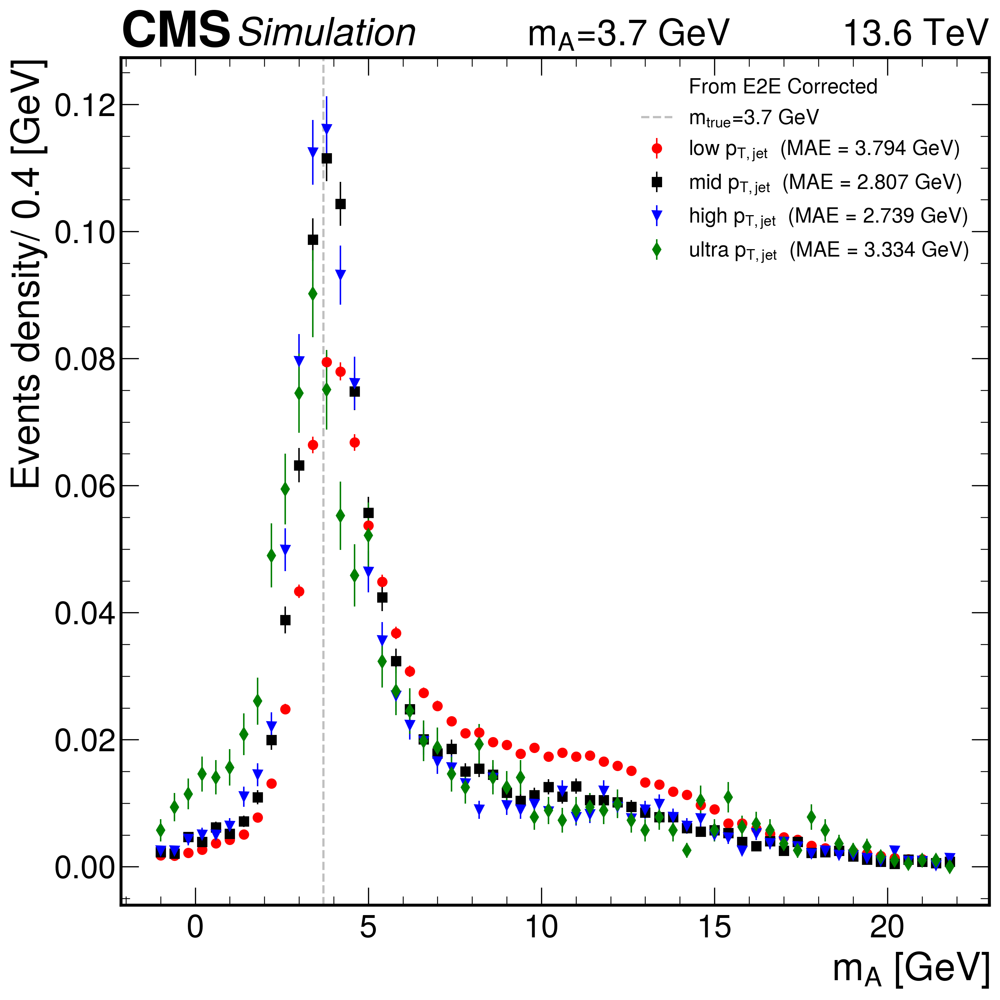

loaded data file ------>  ../analysis_run3/Data_for_plots/mass_regression_test_data/jupyter_notebook_new/ResNet_min_max_scaling_UA/ResNet_min_max_scaling_mN1p2To22/signal_14_epoch_100_inference_data.pkl


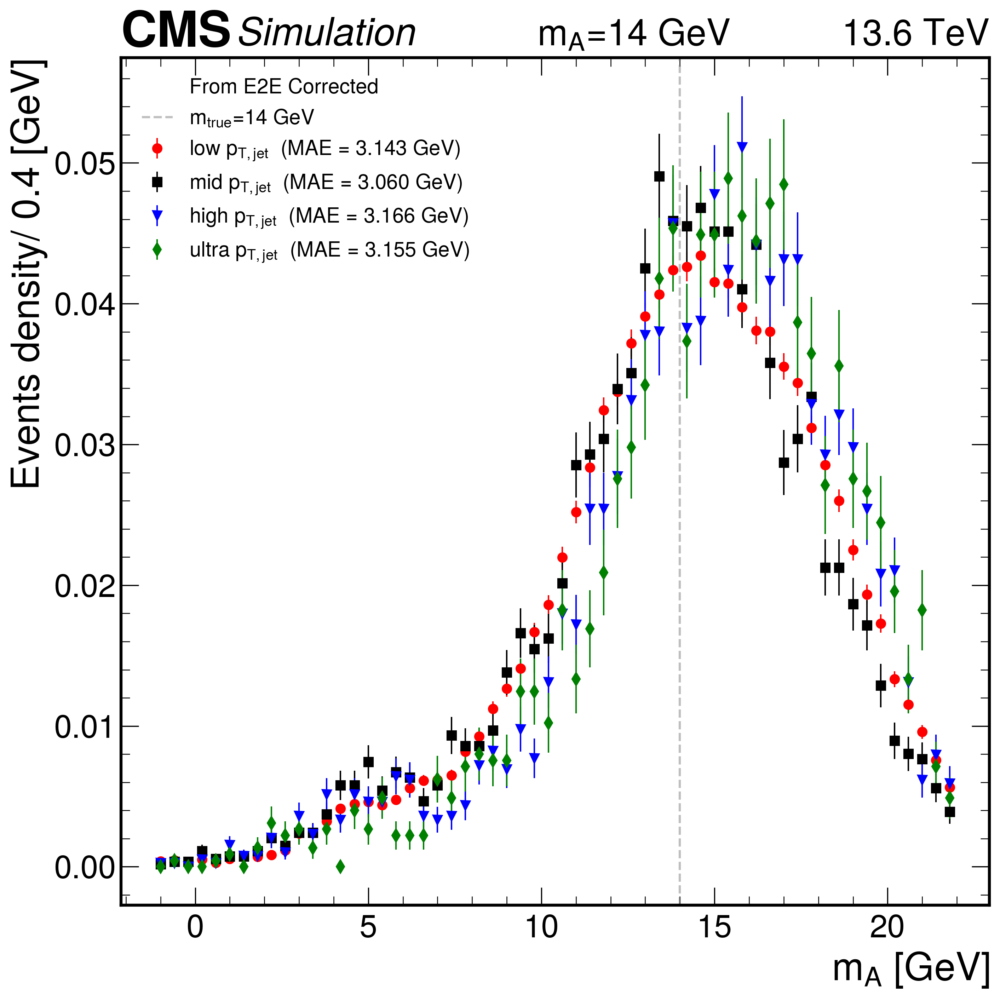

In [71]:
epoch=100
Masses = ['3p7', '14']
for Mass in Masses:
    model_dir = model_dir_ua[-1]
    in_file = glob.glob(f"{data_dir}/{ua_dir}/{model_dir}/signal_{Mass}_epoch_{epoch}_inference_data.pkl")[0]
    plot_e2e_prediction_pf_jet_mass_corrected(mass=Mass, plot="m_pred", method="mean", in_file=in_file)

### Models trained at PL

In [43]:
pl_dir = "ResNet_min_max_scaling_PL"
model_dir_pl = model_dirs_ua = ['ResNet_min_max_m3p6To14_Nodes_4.0','ResNet_min_max_m3p6To18_Nodes_4.0','ResNet_min_max_m1p2To18_Nodes_4.0','ResNet_min_max_mN1p2To18_Nodes_4.0','ResNet_min_max_mN1p2To22_Nodes_4.0']


In [44]:
!ls ../analysis_run3/Data_for_plots/mass_regression_test_data/jupyter_notebook_new/ResNet_min_max_scaling_PL/



ResNet_min_max_m1p2To18_Nodes_4.0  ResNet_min_max_mN1p2To18_Nodes_4.0
ResNet_min_max_m3p6To14_Nodes_4.0  ResNet_min_max_mN1p2To22_Nodes_4.0
ResNet_min_max_m3p6To18_Nodes_4.0


In [80]:
epoch=300
for model_dir in model_dir_pl:
    data_file = glob.glob(f"{data_dir}/{pl_dir}/{model_dir}/epoch_{epoch}_inference_data_m3p6To14.pkl")[0]
    # print(model_dir)
    # print(f"loaded data file ------>  {data_file}")
    infile = open(f"{data_file}", "rb")
    data = pickle.load(infile)

    print(f"data.keys()------>  {data.keys()}")
    infile.close()
    
    m_true__ = data["m_true"]
    m_pred__ = data["m_pred"]
    # print(m_pred__)
#     m0 = data["m0"]
#     print(len(m_true), len(m_pred))
    
#     mask1 = (m_true >= 3.6) & (m_true <=14)
#     m_true_ = m_true[mask1]
#     m_pred_ = m_pred[mask1]
#     m0_ = m0[mask1]
#     mask2 = (m_pred_ >=3.6) & (m_pred_ <=14)
#     m_true__ = m_true_[mask2]
#     m_pred__ = m_pred_[mask2]
#     m0__ = m0_[mask2]


    m0_min = -1.2
    m0_max = 22.1
    bin_size =0.4

    # fig, ax = plt.subplots(dpi=300)
    # plt.hist(m_true,  bins=np.arange(m0_min,m0_max+10,bin_size), histtype='step', label=r'$m_{A, gen}$', linestyle='-', color='blue', linewidth=2)
    # plt.hist(m_pred, bins=np.arange(m0_min,m0_max+10,bin_size), histtype='step', label=r'$m_{A, pred}$', linestyle='-', color='red', linewidth=2)
    # plt.hist(m0, bins=np.arange(m0_min,m0_max+10,bin_size), histtype='step', label=r'$jet_{mass}$', linestyle='-', color='black')
    # plt.xlabel('Mass [GeV]')
    # plt.ylabel('Events/ 0.4 [GeV]')
    # plt.legend(loc='upper right')
    # hep.cms.label(llabel="Simulation", rlabel="13.6 TeV", loc=0, ax=ax)
    # # plt.savefig(f'{out_dir}/mtrue_mpred_mjet_full_hist.pdf', bbox_inches='tight',dpi=300, facecolor = "w")
    # plt.show()

    # fig, ax = plt.subplots(dpi=100)
    # hist = plt.hist2d(np.squeeze(m_true), np.squeeze(m_pred), bins=[np.arange(m0_min, m0_max, .4), np.arange(m0_min, m0_max, .4)])
    # plt.xlabel(r'$m_{A, gen}$ [GeV]')
    # plt.ylabel(r'$m_{A, pred}$ [GeV]')
    # plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--')
    # plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]')
    # hep.cms.label(llabel="Simulation Preliminary", rlabel="13.6 TeV", loc=0, ax=ax)
    # # plt.savefig(f'{out_dir}/mtrue_mpred_full_2d_hist.pdf', bbox_inches='tight',dpi=300, facecolor = "w")
    # plt.show()

    # fig, ax = plt.subplots(dpi=300)
    # hist = plt.hist2d(np.squeeze(m_true__), np.squeeze(m_pred__), bins=[np.arange(3.6, 14.1, .4), np.arange(3.6, 14.1, .4)])
    # plt.xlabel(r'$m_{A, gen}$ [GeV]')
    # plt.ylabel(r'$m_{A, pred}$ [GeV]')
    # plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--')
    # plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]')
    # hep.cms.label(llabel="Simulation", rlabel="13.6 TeV", loc=0, ax=ax)
    # # plt.savefig(f'{out_dir}/mtrue_mpred_roi_2d_hist.pdf', bbox_inches='tight',dpi=300, facecolor = "w")
    # plt.show()


    # fig, ax = plt.subplots()
    # plt.plot(m_true__, m_pred__, ".", color='black', alpha=0.02, label='MAE = %.3f GeV'%np.mean(np.abs(m_true__ - m_pred__)))
    # plt.xlabel(r'$m_{A, gen}$ [GeV]')
    # plt.ylabel(r'$m_{A, pred}$ [GeV]')
    # m0_min, m0_max = 3.6, 14.0
    # plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--')
    # hep.cms.label(llabel="Simulation", rlabel="13.6 TeV", loc=0, ax=ax)
    # plt.xlim(m0_min, m0_max)
    # plt.ylim(m0_min, m0_max)
    # plt.legend(loc='upper left', frameon=True, framealpha=0.5, facecolor='white', edgecolor='black')
    # # plt.savefig(f'{out_dir}/mtrue_mpred_roi_scatter_{model_dir}_epoch_{epoch}.pdf', bbox_inches='tight',dpi=300, facecolor = "w")
    # plt.show()



data.keys()------>  dict_keys(['m_true', 'm_pred', 'm0', 'mar', 'mre'])
data.keys()------>  dict_keys(['m_true', 'm_pred', 'm0', 'mar', 'mre'])
data.keys()------>  dict_keys(['m_true', 'm_pred', 'm0', 'mar', 'mre'])
data.keys()------>  dict_keys(['m_true', 'm_pred', 'm0', 'mar', 'mre'])
data.keys()------>  dict_keys(['m_true', 'm_pred', 'm0', 'mar', 'mre'])


Loaded data from: ../analysis_run3/Data_for_plots/mass_regression_test_data/jupyter_notebook/ResNet_min_max_scaling_m3p6To14/epoch_43_inference_data_m3p6To14.pkl
Available keys: dict_keys(['m_true', 'm_pred', 'm0', 'mar', 'mre'])


NameError: name 'mplhep' is not defined

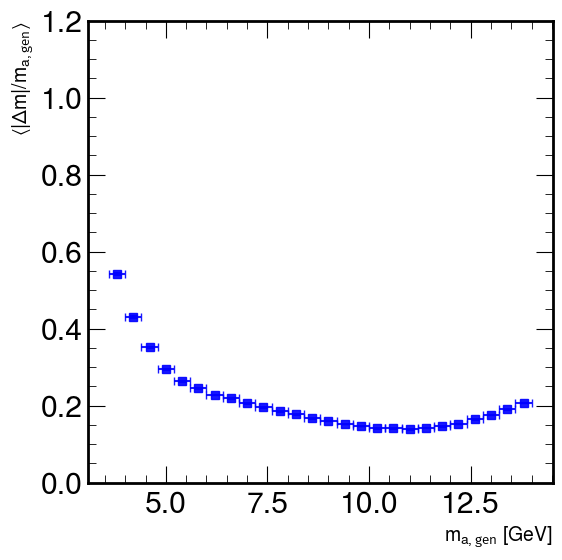

In [6]:


# Parameters
epoch = 43
out_dir = '../analysis_run3/AN_Note_Plot'
os.makedirs(out_dir, exist_ok=True)

model_dirs = ['ResNet_min_max_scaling_m3p6To14']

for model_dir in model_dirs:
    data_file = f'../analysis_run3/Data_for_plots/mass_regression_test_data/jupyter_notebook/{model_dir}/epoch_{epoch}_inference_data_m3p6To14.pkl'
    with open(data_file, "rb") as infile:
        data = pickle.load(infile)

    print(f"Loaded data from: {data_file}")
    print(f"Available keys: {data.keys()}")

    m_true = data["m_true"]
    m_pred = data["m_pred"]

    # Filter
    mask1 = (m_true >= 3.6) & (m_true <= 14)
    m_true_ = m_true[mask1]
    m_pred_ = m_pred[mask1]

    mask2 = (m_pred_ >= 3.6) & (m_pred_ <= 14)
    m_true__ = m_true_[mask2]
    m_pred__ = m_pred_[mask2]

    # Relative error
    rel_error = np.abs(m_pred__ - m_true__) / m_true__

    # Bins
    bin_width = 0.4
    bins = np.arange(3.6, 14.1, bin_width)
    bin_centers = 0.5 * (bins[1:] + bins[:-1])
   
    xerr = bin_width / 2

    means, stds, std_errors = [], [], []

    for i in range(len(bins) - 1):
        mask = (m_true__ >= bins[i]) & (m_true__ < bins[i + 1])
        if np.sum(mask) > 0:
            rel_err_bin = rel_error[mask]
            mean = np.mean(rel_err_bin)
            std = np.std(rel_err_bin)
            stderr = std / np.sqrt(np.sum(mask))
            means.append(mean)
            stds.append(std)
            std_errors.append(stderr)
        else:
            means.append(np.nan)
            stds.append(0)
            std_errors.append(0)

    means = np.array(means)
    stds = np.array(stds)
    std_errors = np.array(std_errors)

    # Plot
    plt.figure(figsize=(6, 6))

#     # Shaded band = ±1 std (full spread)
#     plt.fill_between(
#         bin_centers,
#         means - std_errors,
#         means + std_errors,
#         color='lightblue',
#         alpha=0.4,
        
#     )

    # Mean + yerr = std error, xerr = bin width
    plt.errorbar(
        bin_centers,
        means,
        xerr=xerr,
        yerr=std_errors,
        fmt='s',
        color='blue',
        ecolor='blue',
        capsize=3,
        alpha=0.9,
        # label='Mean ± SE'
    )

    # Labels and CMS tag
    plt.xlabel(r'$m_{a, \mathrm{gen}}$ [GeV]', fontsize=14)
    plt.ylabel(r'$\langle |\Delta m| / m_{a, \mathrm{gen}} \rangle$', fontsize=14)
    plt.ylim(0, 1.2)
    # mplhep.cms.text("Simulation", loc=0)
    plt.legend()
    plt.tight_layout()
    plt.show()
    


Signal Mass :  3.7


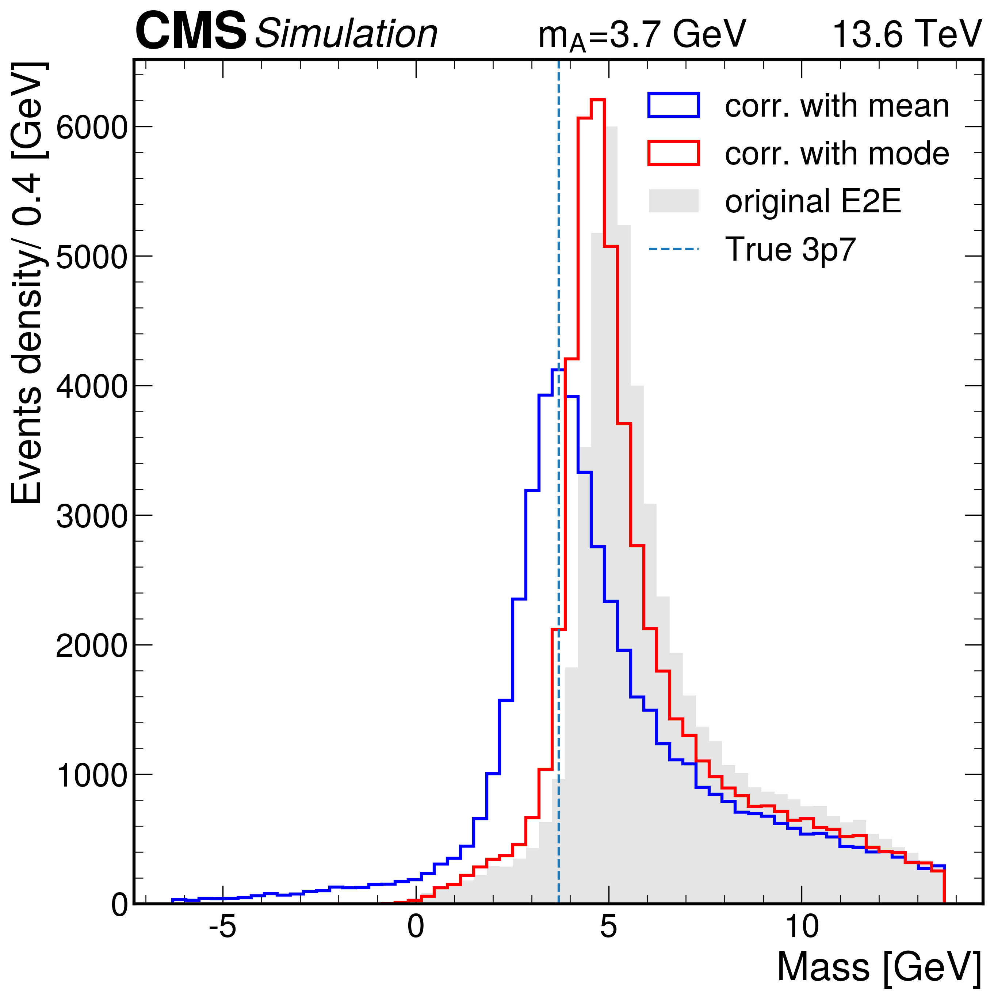

In [10]:
plot_signal_corrected_with_mean_mode(Mass = '3p7')

Signal Mass :  14


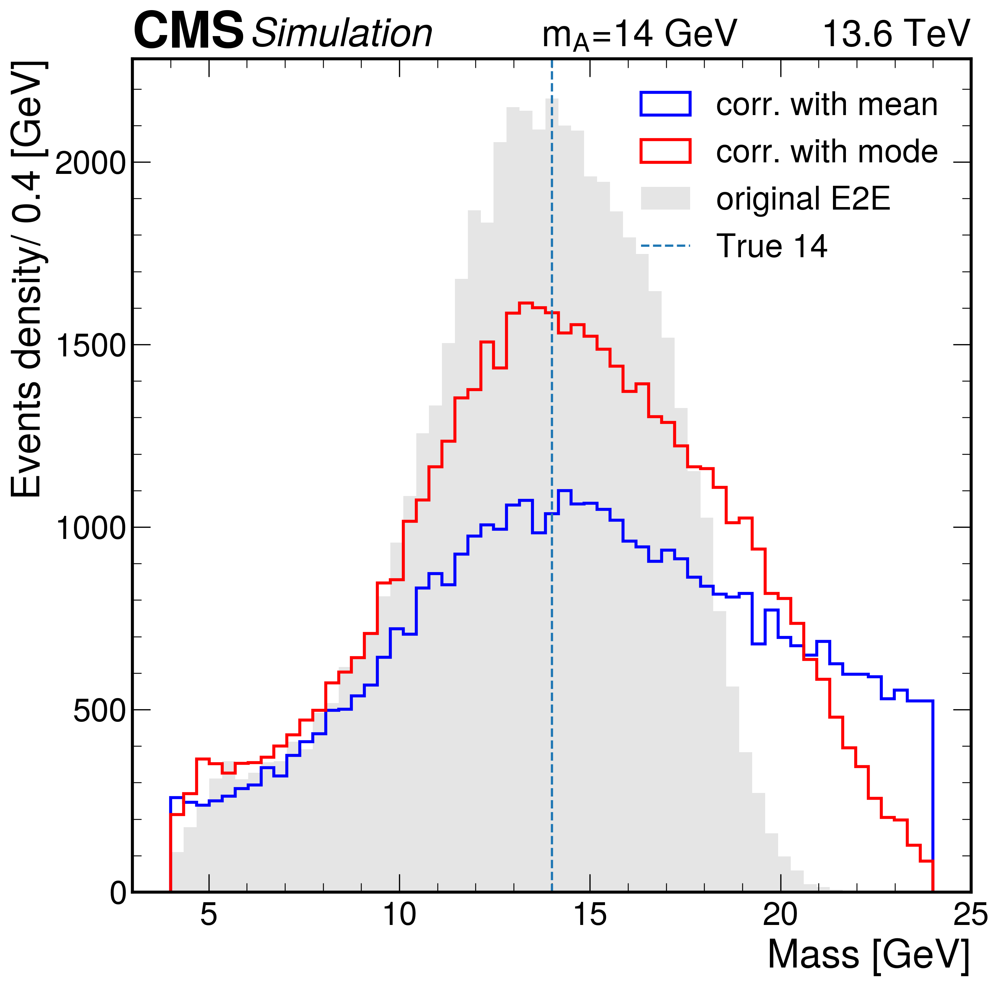

In [11]:
plot_signal_corrected_with_mean_mode(Mass = '14')

loaded data file ------>  ../analysis_run3/Data_for_plots/mass_regression_test_data/upper_lower_streching_epoch_36_signal_mass_3p7_inference_data.pkl


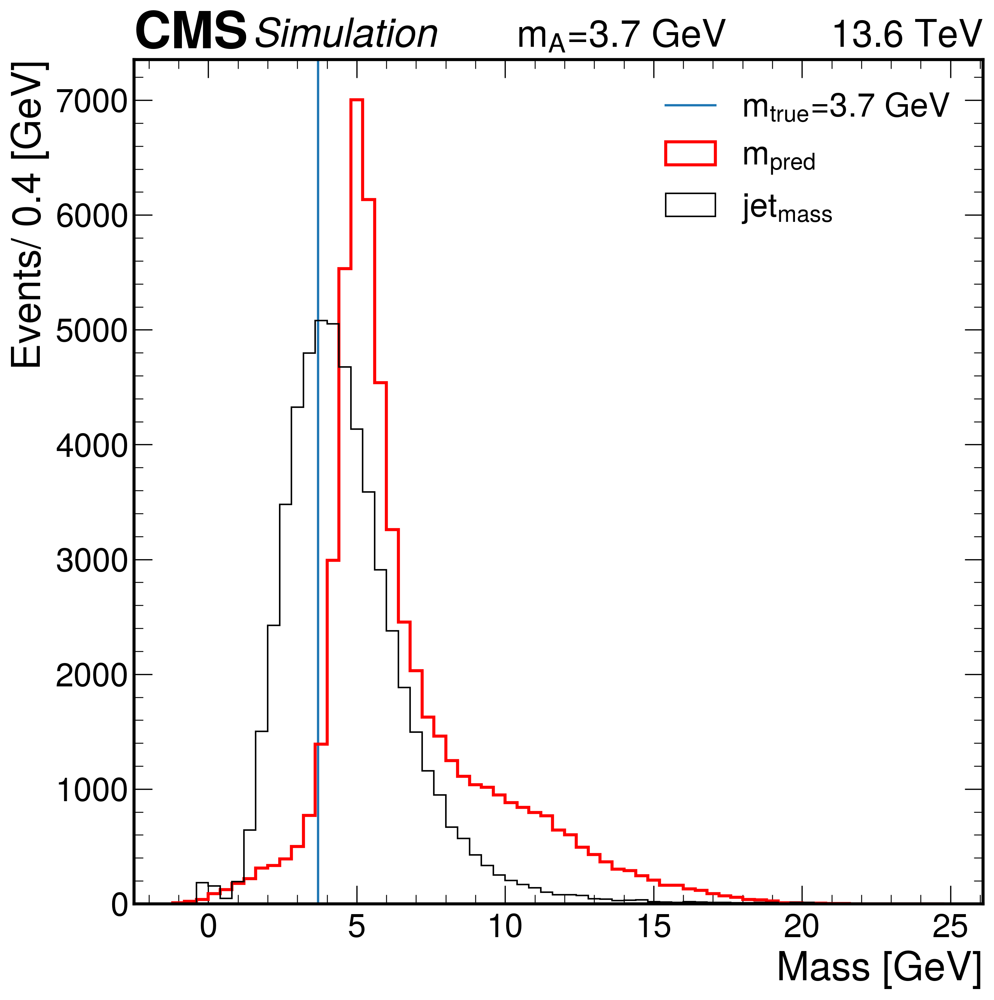

loaded data file ------>  ../analysis_run3/Data_for_plots/mass_regression_test_data/upper_lower_streching_epoch_36_signal_mass_14_inference_data.pkl


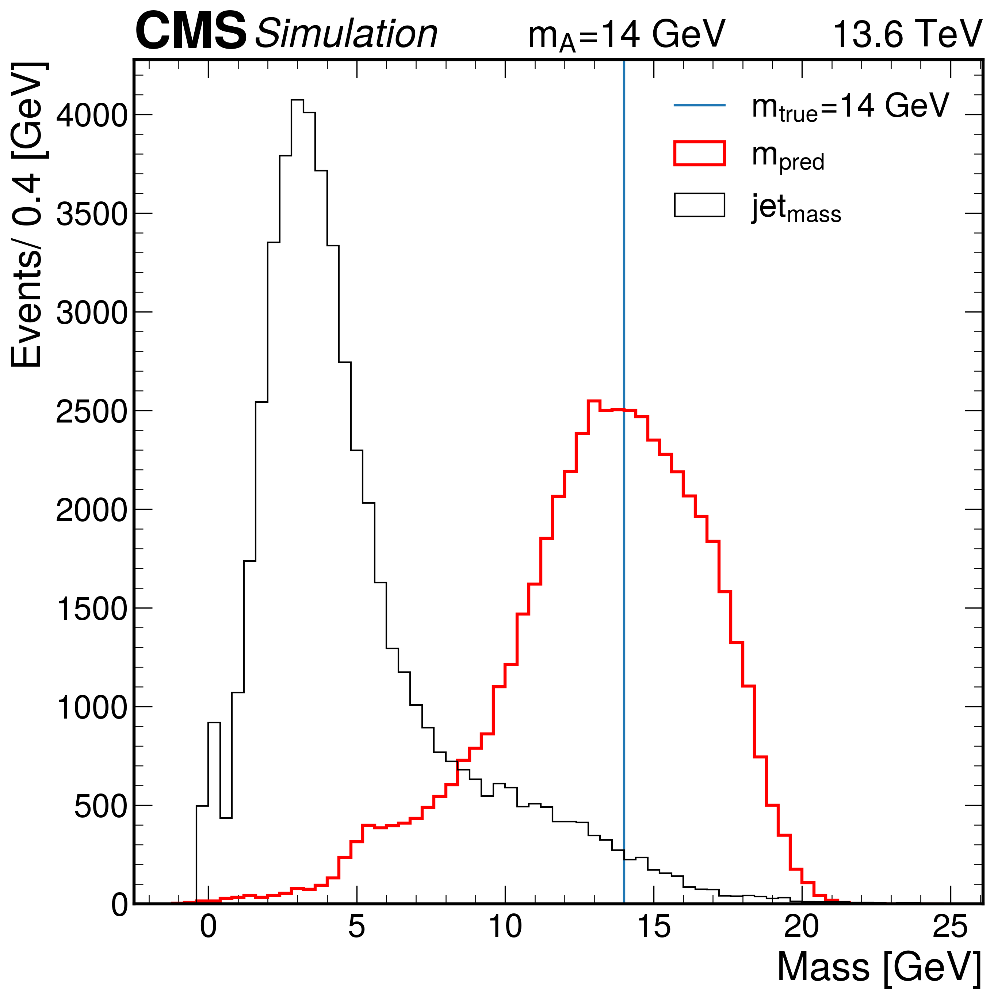

In [13]:
Mass = ['3p7', '14']
# Mass=Mass[1]
for Mass in Mass:
    data_file = f'../analysis_run3/Data_for_plots/mass_regression_test_data/upper_lower_streching_epoch_36_signal_mass_{Mass}_inference_data.pkl'
    # data_file = f'../analysis_run3/mass_regression_test_data/lower_streching_epoch_36_signal_mass_{Mass}_inference_data.pkl'
    # data_file = f'../analysis_run3/mass_regression_test_data/min_max_epoch_36_signal_mass_{Mass}_inference_data.pkl'
    infile = open(f"{data_file}", "rb")
    data = pickle.load(infile)
    print(f"loaded data file ------>  {data_file}")
    infile.close()

    m_true = {'3p7':3.7, '4':4, '6':6, '14':14}.get(Mass, None)
    m_pred = data["m_pred"]
    jet_mass = data["jet_mass"]
    jet_pt = data["jet_pt"]

    mask2 = (m_pred >=3.6) & (m_pred <=14)
    m_pred_ = m_pred[mask2]
    jet_mass_ = jet_mass[mask2]
    jet_pt_ = jet_pt[mask2]

    m0_min=-1.2
    m0_max=25.1
    bin_size =0.4
    fig, ax = plt.subplots(dpi=300)
    plt.axvline(m_true, label=r"$m_{true}$" + f"={m_true} GeV")
    plt.hist(m_pred, bins=np.arange(m0_min,m0_max,bin_size), histtype='step', label=r'$m_{pred}$', linestyle='-', color='red', linewidth=2)
    plt.hist(jet_mass, bins=np.arange(m0_min,m0_max,bin_size), histtype='step', label=r'$jet_{mass}$', linestyle='-', color='black')
    plt.xlabel('Mass [GeV]')
    plt.ylabel('Events/ 0.4 [GeV]')
    plt.legend(loc='upper right')
    hep.cms.label(llabel="Simulation", rlabel=f"$m_A$={m_true} GeV          "    +   "13.6 TeV", loc=0, ax=ax)
    plt.show()



loaded data file ------>  ../analysis_run3/Data_for_plots/mass_regression_test_data/upper_lower_streching_epoch_36_signal_mass_3p7_inference_data.pkl


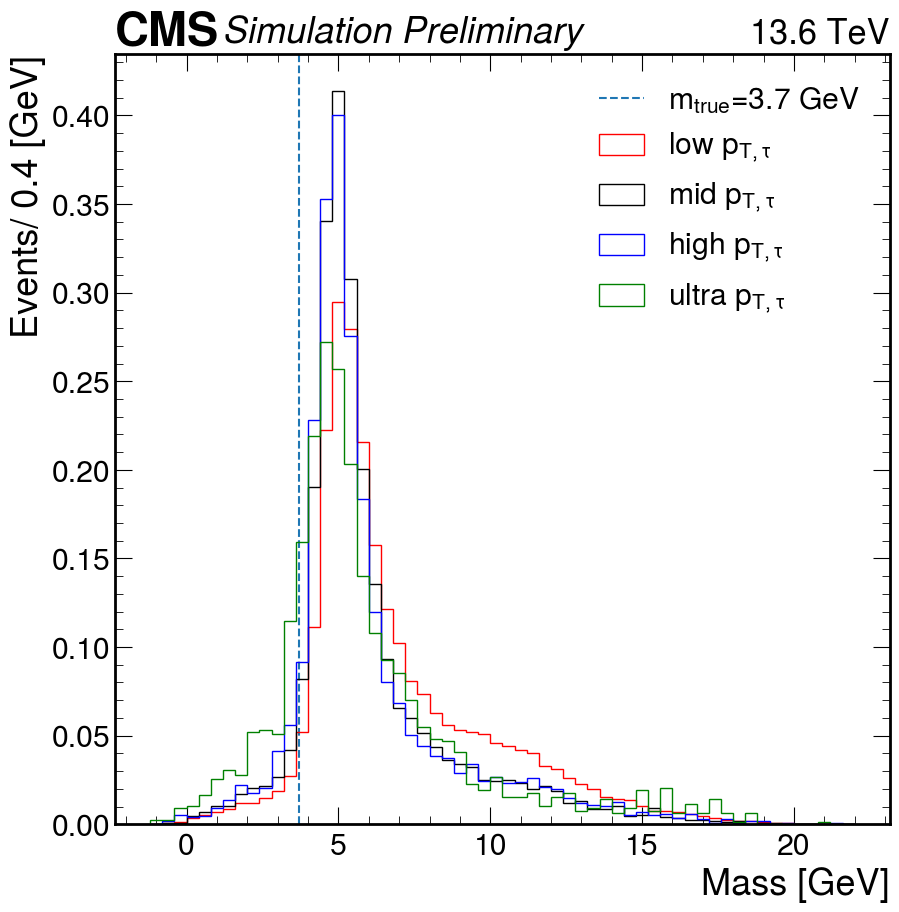

In [25]:
Mass ='3p7'
data_file = f'../analysis_run3/Data_for_plots/mass_regression_test_data/upper_lower_streching_epoch_36_signal_mass_3p7_inference_data.pkl'
# data_file = f'../analysis_run3/mass_regression_test_data/lower_streching_epoch_36_signal_mass_{Mass}_inference_data.pkl'
# data_file = f'../analysis_run3/mass_regression_test_data/min_max_epoch_36_signal_mass_{Mass}_inference_data.pkl'
infile = open(f"{data_file}", "rb")
data = pickle.load(infile)
print(f"loaded data file ------>  {data_file}")
infile.close()

m_true = {'3p7':3.7, '4':4, '6':6, '14':14}.get(Mass, None)
m_pred = data["m_pred"]
jet_mass = data["jet_mass"]
jet_pt = data["jet_pt"]

mask1 = (jet_pt >=20) & (jet_pt <55)
mask2 = (jet_pt >=55) & (jet_pt <70)
mask3 = (jet_pt >=70) & (jet_pt <100)
mask4 = jet_pt >=100

m_pred1= m_pred[mask1]
m_pred2= m_pred[mask2] 
m_pred3= m_pred[mask3]
m_pred4= m_pred[mask4]
         
m0_min=-1.2
m0_max=22.1
bin_size =0.4
bins=np.arange(m0_min,m0_max,bin_size)        
fig, ax = plt.subplots(figsize=(10,10), dpi=100)
plt.axvline(m_true, linestyle='--', label=r"$m_{true}$" + f"={m_true} GeV")
# plt.hist(m_pred1,bins=np.arange(m0_min,m0_max,bin_size), histtype='step', label='Pt:[20-50] GeV', linestyle='-', color='red', linewidth=2)
# plt.hist(m_pred2,bins=np.arange(m0_min,m0_max,bin_size), histtype='step', label='Pt:[50-70] GeV', linestyle='-', color='blue', linewidth=2)
# plt.hist(m_pred3,bins=np.arange(m0_min,m0_max,bin_size), histtype='step', label='Pt:[70-100] GeV', linestyle='-', color='green', linewidth=2)
# plt.hist(m_pred4,bins=np.arange(m0_min,m0_max,bin_size), histtype='step', label='Pt:>=100 GeV', linestyle='-', color='grey', linewidth=2)
plt.hist(m_pred1, bins=bins, histtype='step', label=r'low $p_{T,\tau}$', color='red', density=True, linewidth=1)
plt.hist(m_pred2, bins=bins, histtype='step', label=r'mid $p_{T,\tau}$', color='black', density=True, linewidth=1)
plt.hist(m_pred3, bins=bins, histtype='step', label=r'high $p_{T,\tau}$', color='blue', density=True, linewidth=1)
plt.hist(m_pred4, bins=bins, histtype='step', label=r'ultra $p_{T,\tau}$', color='green', density=True, linewidth=1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]')
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13.6 TeV", loc=0, ax=ax)
plt.show()

loaded data file ------>  ../analysis_run3/Data_for_plots/mass_regression_test_data/jupyter_notebook/ResNet_min_max_scaling_m3p6To14/epoch_43_inference_data_m3p6To14.pkl


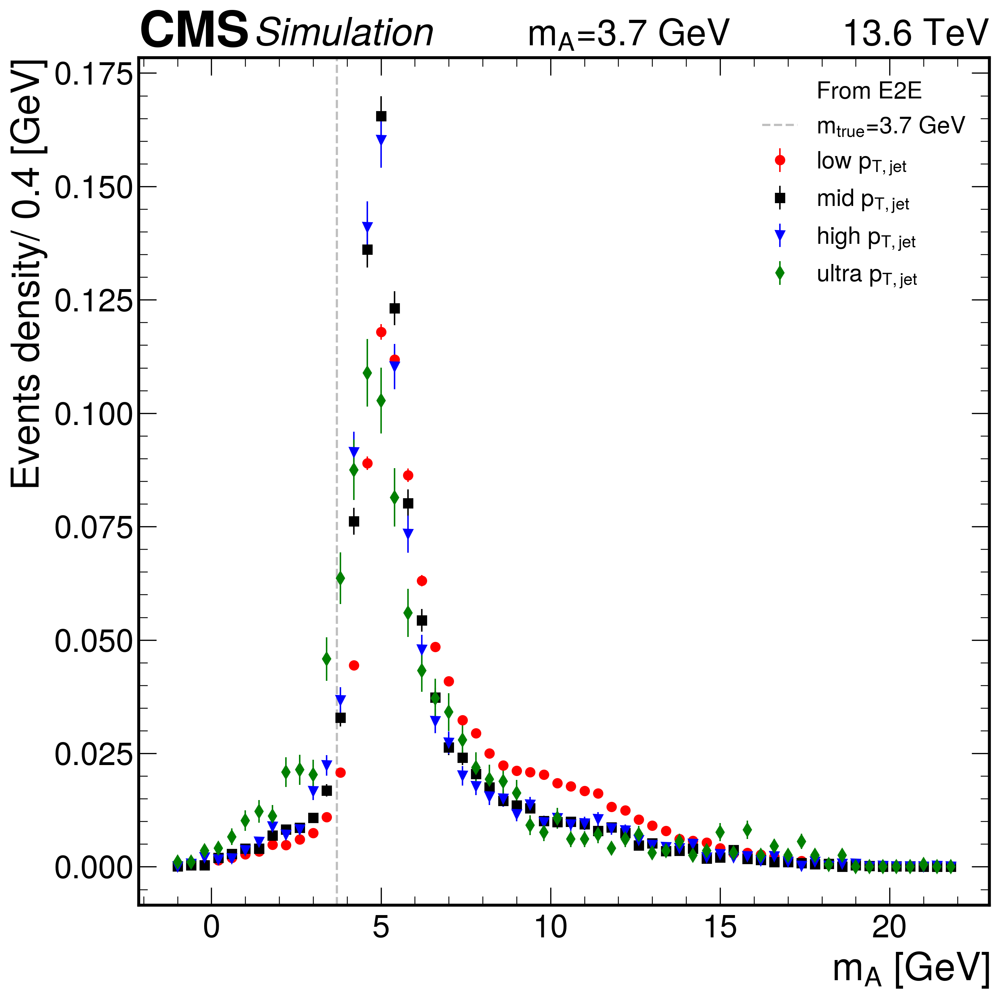

In [256]:
# Mass = ['3p7', '14']
# Mass=Mass[1]
# data_file = f'../analysis_run3/Data_for_plots/mass_regression_test_data/upper_lower_streching_epoch_36_signal_mass_3p7_inference_data.pkl'
# data_file = f'../analysis_run3/mass_regression_test_data/lower_streching_epoch_36_signal_mass_{Mass}_inference_data.pkl'
# data_file = f'../analysis_run3/mass_regression_test_data/min_max_epoch_36_signal_mass_{Mass}_inference_data.pkl'
def plot_e2e_prediction_pf_jet_mass(mass=3.7, plot="m_pred", in_file="../analysis_run3/Data_for_plots/mass_regression_test_data/upper_lower_streching_epoch_36_signal_mass_3p7_inference_data.pkl"):
    infile = open(f"{in_file}", "rb")
    data = pickle.load(infile)
    print(f"loaded data file ------>  {data_file}")
    infile.close()
    m0_min, m0_max, bin_size = -1.2, 22.2, 0.4
    m_true = mass
    m_pred = data[f"{plot}"]
    jet_mass = data["jet_mass"]
    jet_pt = data["jet_pt"]

    mask1 = (jet_pt >=20) & (jet_pt <55)
    mask2 = (jet_pt >=55) & (jet_pt <70)
    mask3 = (jet_pt >=70) & (jet_pt <100)
    mask4 = jet_pt >=100

    m_pred1= m_pred[mask1]
    m_pred2= m_pred[mask2] 
    m_pred3= m_pred[mask3]
    m_pred4= m_pred[mask4]



    fig, ax = plt.subplots(dpi=300)
    if plot=='m_pred': 
        plt.plot([], [], ' ', label='From E2E')
        name_tag='E2E'
    else: 
         plt.plot([], [], ' ', label='From PF Jet mass')
         name_tag='Jet_mass'
    plt.axvline(m_true, linestyle='--', label=r"$m_{true}$" + f"={m_true} GeV", color='grey', alpha=0.5)

    # Define bin edges and centers
    bins = np.arange(m0_min, m0_max, bin_size)
    bin_centers = 0.5 * (bins[1:] + bins[:-1])




    # Helper to plot histogram and error bars
    def plot_with_errors(data, label, color, error_bar):
        counts, _ = np.histogram(data, bins=bins)
        norm = np.sum(counts)
        counts_norm = counts / norm
        errors = np.sqrt(counts) / norm
        # plt.hist(data, bins=bins, histtype='step', label=label, color=color, density=True, linewidth=2)
        plt.errorbar(bin_centers, counts_norm, yerr=errors, fmt=error_bar, color=color, markersize=6, linewidth=1, label=label)

    # Plot each pt region
    plot_with_errors(m_pred1, r'low $p_{T,jet}$', 'red', 'o')
    plot_with_errors(m_pred2, r'mid $p_{T,jet}$', 'black', 's')
    plot_with_errors(m_pred3, r'high $p_{T,jet}$', 'blue', 'v')
    plot_with_errors(m_pred4, r'ultra $p_{T,jet}$', 'green', 'd')
    plt.xlabel('$m_A$ [GeV]')
    plt.ylabel('Events density/ 0.4 [GeV]')
    plt.legend(loc='best', fontsize=16)
    hep.cms.label(llabel="Simulation  ", rlabel=f"$m_A$={m_true} GeV           "   +   "13.6 TeV", loc=0, ax=ax)
    plt.tight_layout()
    mass_str = str(mass).replace('.', 'p')
    # plt.savefig(f'{out_dir}/signal_mass_{Mass}_prediction_from_{name_tag}.pdf',facecolor='w',dpi=300)
    plt.show()
plot_e2e_prediction_pf_jet_mass(mass=3.7, plot="m_pred", in_file="../analysis_run3/Data_for_plots/mass_regression_test_data/upper_lower_streching_epoch_36_signal_mass_3p7_inference_data.pkl")

loaded data file ------>  ../analysis_run3/Data_for_plots/mass_regression_test_data/upper_lower_streching_epoch_36_signal_mass_3p7_inference_data.pkl


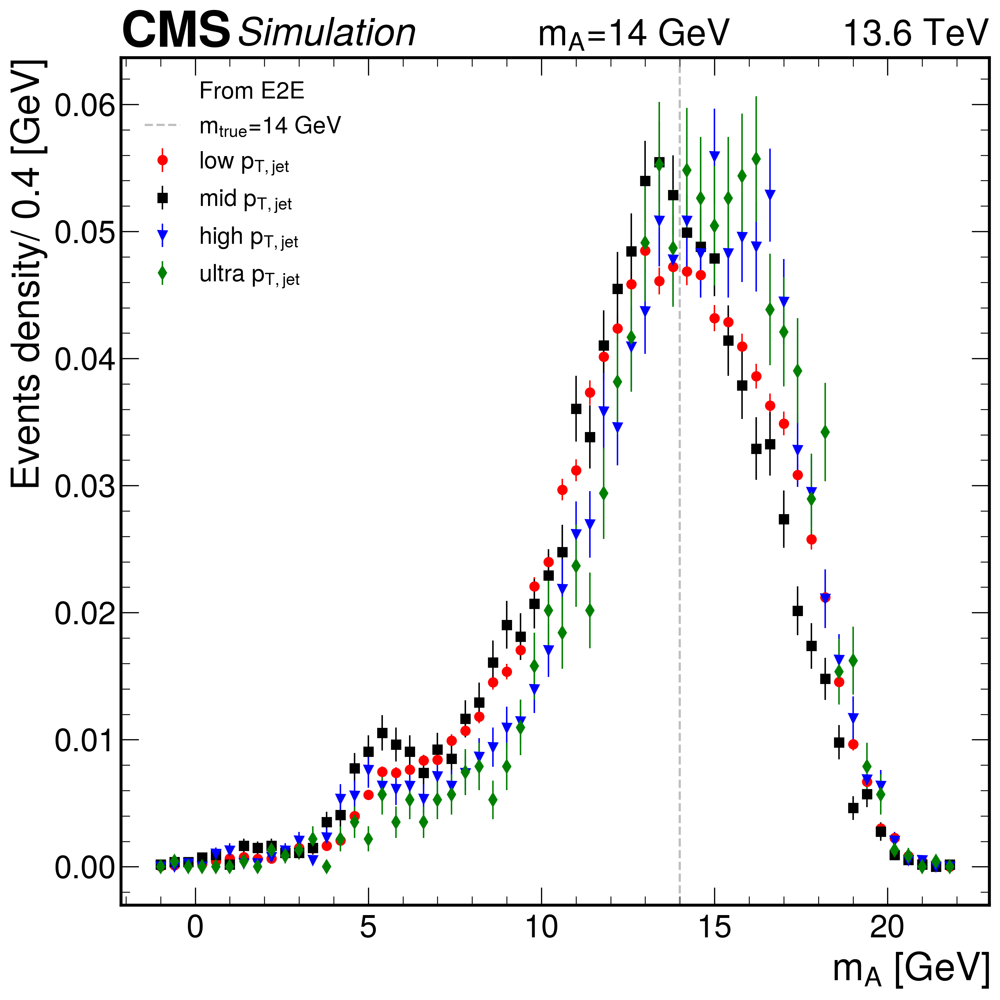

In [94]:
plot_e2e_prediction_pf_jet_mass(mass=14, plot="m_pred", in_file="../analysis_run3/Data_for_plots/mass_regression_test_data/upper_lower_streching_epoch_36_signal_mass_14_inference_data.pkl")

In [178]:
def plot_e2e_prediction_pf_jet_mass_corrected(mass=3.7, plot="m_pred", method="mean", in_file="../analysis_run3/Data_for_plots/mass_regression_test_data/upper_lower_streching_epoch_36_signal_mass_3p7_inference_data.pkl"):
    infile = open(f"{in_file}", "rb")
    data = pickle.load(infile)
    print(f"loaded data file ------>  {data_file}")
    infile.close()
    m0_min, m0_max, bin_size = -1.2, 22.2, 0.4
    m_true = mass
    m_pred = data[f"{plot}"]
    jet_mass = data["jet_mass"]
    jet_pt = data["jet_pt"]
    if method=="mean": m_pred = corrected_pred_mean(m_pred)
    if method=="mode": m_pred = corrected_pred_mode(m_pred)
    mask1 = (jet_pt >=20) & (jet_pt <55)
    mask2 = (jet_pt >=55) & (jet_pt <70)
    mask3 = (jet_pt >=70) & (jet_pt <100)
    mask4 = jet_pt >=100

    m_pred1= m_pred[mask1]
    m_pred2= m_pred[mask2] 
    m_pred3= m_pred[mask3]
    m_pred4= m_pred[mask4]



    fig, ax = plt.subplots(dpi=300)
    if plot=='m_pred': 
        plt.plot([], [], ' ', label='From E2E Corrected')
        name_tag='E2E'
    else: 
         plt.plot([], [], ' ', label='From PF Jet mass')
         name_tag='Jet_mass'
    plt.axvline(m_true, linestyle='--', label=r"$m_{true}$" + f"={m_true} GeV", color='grey', alpha=0.5)

    # Define bin edges and centers
    bins = np.arange(m0_min, m0_max, bin_size)
    bin_centers = 0.5 * (bins[1:] + bins[:-1])




    # Helper to plot histogram and error bars
    def plot_with_errors(data, label, color, error_bar):
        counts, _ = np.histogram(data, bins=bins)
        norm = np.sum(counts)
        counts_norm = counts / norm
        errors = np.sqrt(counts) / norm
        # plt.hist(data, bins=bins, histtype='step', label=label, color=color, density=True, linewidth=2)
        plt.errorbar(bin_centers, counts_norm, yerr=errors, fmt=error_bar, color=color, markersize=6, linewidth=1, label=label)

    # Plot each pt region
    plot_with_errors(m_pred1, r'low $p_{T,jet}$', 'red', 'o')
    plot_with_errors(m_pred2, r'mid $p_{T,jet}$', 'black', 's')
    plot_with_errors(m_pred3, r'high $p_{T,jet}$', 'blue', 'v')
    plot_with_errors(m_pred4, r'ultra $p_{T,jet}$', 'green', 'd')
    plt.xlabel('$m_A$ [GeV]')
    plt.ylabel('Events density/ 0.4 [GeV]')
    plt.legend(loc='best', fontsize=16)
    hep.cms.label(llabel="Simulation  ", rlabel=f"$m_A$={m_true} GeV           "   +   "13.6 TeV", loc=0, ax=ax)
    plt.tight_layout()
    mass_str = str(mass).replace('.', 'p')
    plt.savefig(f'{out_dir}/signal_mass_{mass_str}_prediction_from_{name_tag}_corrected_using_{method}.pdf',facecolor='w',dpi=300)
    plt.show()
    


loaded data file ------>  ../analysis_run3/Data_for_plots/mass_regression_test_data/jupyter_notebook_new/ResNet_min_max_scaling_UA/ResNet_min_max_scaling_m3p6To14/epoch_100_inference_data_m3p6To14.pkl


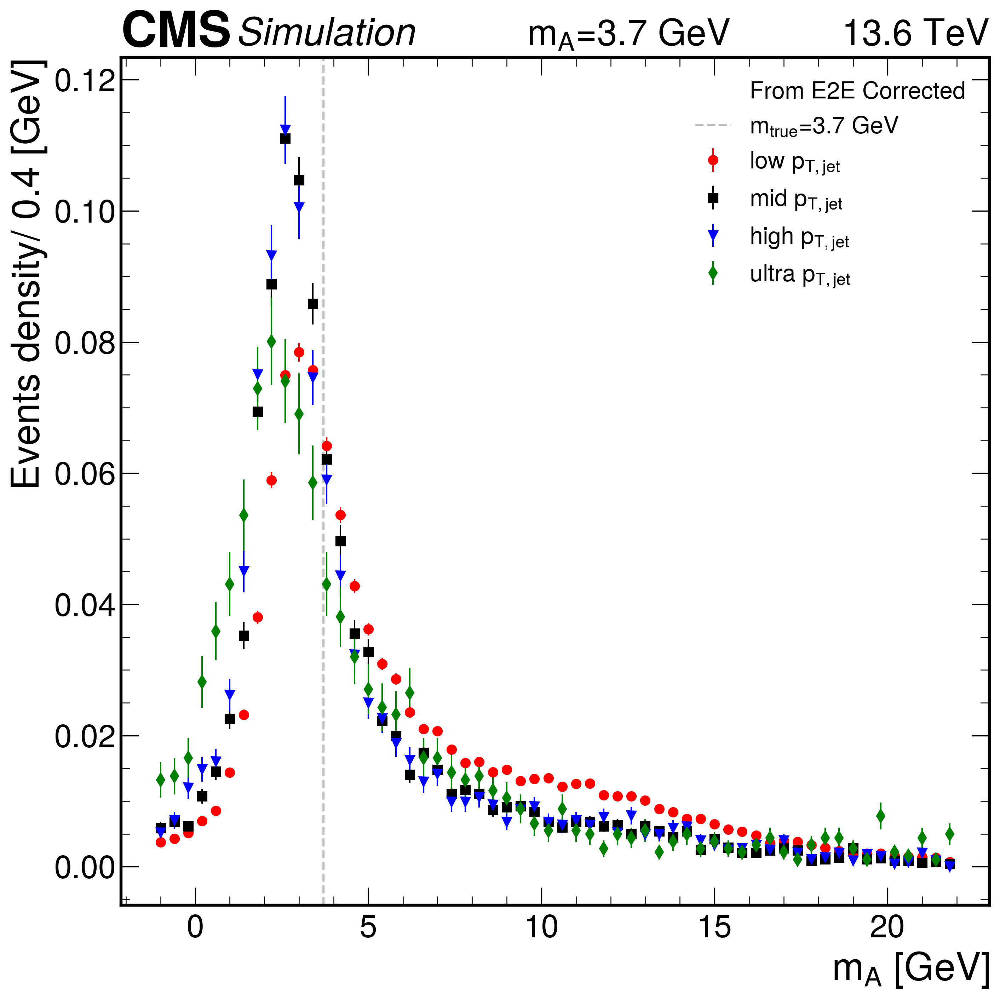

loaded data file ------>  ../analysis_run3/Data_for_plots/mass_regression_test_data/jupyter_notebook_new/ResNet_min_max_scaling_UA/ResNet_min_max_scaling_m3p6To14/epoch_100_inference_data_m3p6To14.pkl


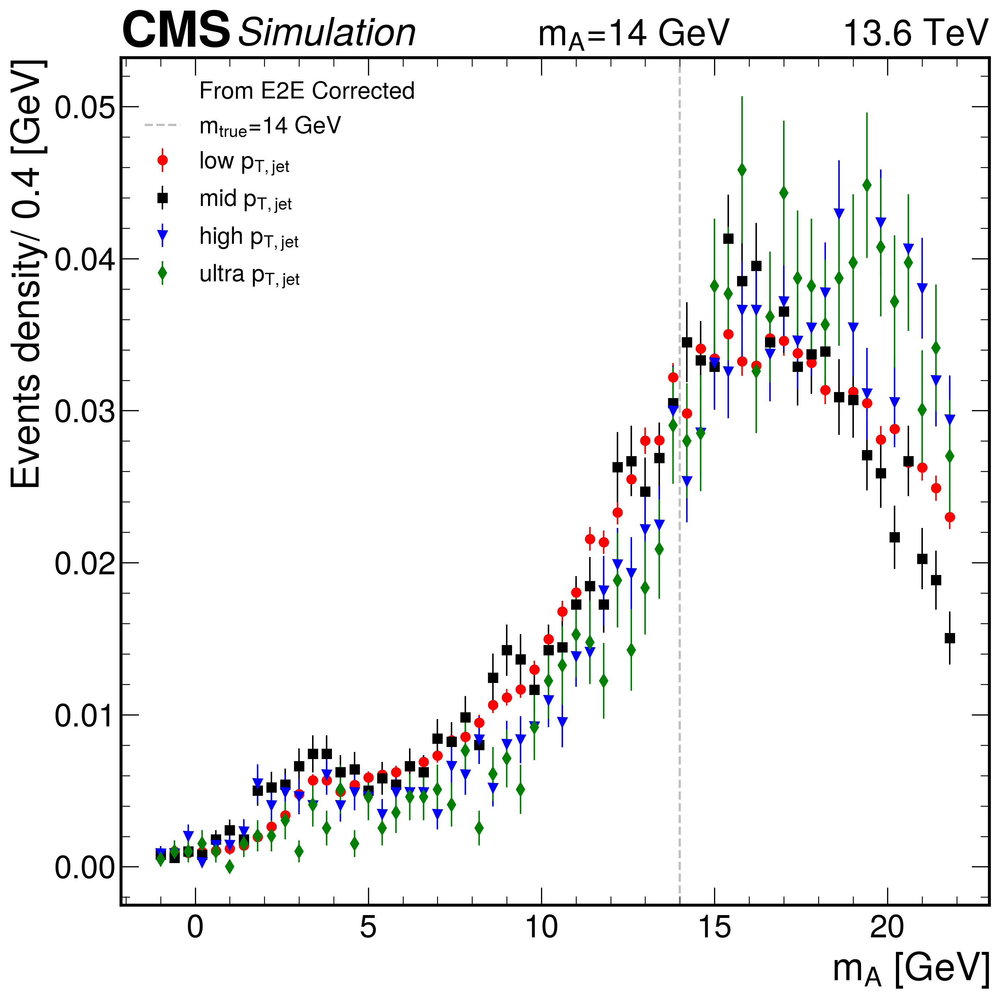

In [179]:
plot_e2e_prediction_pf_jet_mass_corrected(mass=3.7, plot="m_pred", method='mean', in_file="../analysis_run3/Data_for_plots/mass_regression_test_data/upper_lower_streching_epoch_36_signal_mass_3p7_inference_data.pkl")
plot_e2e_prediction_pf_jet_mass_corrected(mass=14,  plot="m_pred", method="mean", in_file="../analysis_run3/Data_for_plots/mass_regression_test_data/upper_lower_streching_epoch_36_signal_mass_14_inference_data.pkl")